In [2]:
import plot
import importlib
import numpy as np
import random
import os
import glob
import h5py
import math
import scipy
import random
import classify
import warnings
import preprocess
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from os import path
from scipy import stats
from scipy.io import loadmat
from matplotlib import gridspec
from numpy.linalg import norm
from scipy.spatial import distance
from sklearn import decomposition
from matplotlib.colors import LinearSegmentedColormap
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

np.random.seed(42)
random.seed(42)


In [3]:
# reload when updating code
importlib.reload(preprocess)
# mouse and date

mice = ['NN11'] 
dates_per_mouse = {'NN11': ['210626']}

for mouse in mice:
    dates = dates_per_mouse[mouse]  # Get the list of dates for the current mouse
    days = len(dates)  # Correct number of days for this mouse
    
    for day_idx, date in enumerate(dates):
        print(mouse, date)
        
        # Create folders to save files
        paths = preprocess.create_folders(mouse, date)
        print('folders created')
        
        # Import data for mouse and date as dict
        session_data = preprocess.load_data(paths)
        print('data loaded')
        
        # Process and plot behavior
        behavior = preprocess.process_behavior(session_data, paths)
        print('behavior done')
        
        # Save masks so can run in Matlab to process other planes
        # preprocess.cell_masks(paths, 0)
        print('masks saved')
        
        # Grab activity
        deconvolved = preprocess.process_activity(paths, 'spks', 3, 0)
        print('activity processed')
        
        # Normalize activity
        norm_deconvolved = preprocess.normalize_deconvolved(deconvolved, behavior, paths, 0)
        print('activity normalized')
        
        # Gaussian filter activity
        norm_moving_deconvolved_filtered = preprocess.difference_gaussian_filter(norm_deconvolved, 4, behavior, paths, 0)
        print('activity filtered')
        
        # Make trial-averaged traces and baseline subtract
        mean_cs_1_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_1')
        mean_cs_2_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_2')
        print('traces done')
        
        # Get significant cells
        [cs_1_poscells, cs_1_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_1')
        [cs_2_poscells, cs_2_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_2')
        [both_poscells, both_sigcells] = preprocess.combine_sig(cs_1_poscells, cs_1_negcells, cs_2_poscells, cs_2_negcells)
        print('sig cells done')
        
        # Get index of top cell differences
        idx = preprocess.get_index(behavior, mean_cs_1_responses_df, mean_cs_2_responses_df, cs_1_poscells, cs_2_poscells, both_poscells, both_sigcells, paths, 1)
        print('idx done')
        
        # Get prior for synchronous cue activity
        prior = classify.prior(norm_moving_deconvolved_filtered, idx['cs_1'], idx['cs_2'], behavior, [])
        print('prior done')
        
        # Logistic regression
        #y_pred, feature_importance_all = classify.log_regression_no_splits(behavior, norm_deconvolved, norm_moving_deconvolved_filtered, both_poscells, prior)
        y_pred_log, feature_importance_all = classify.log_regression_splits(behavior, norm_deconvolved, norm_moving_deconvolved_filtered, both_poscells, prior)

        print('logistic regression done')
        
        # Process classified output
        y_pred = classify.process_classified(y_pred_log, prior, paths, 1)
        print('classified done')
    


NN11 210626
folders created
data loaded
behavior done
masks saved
activity processed
activity normalized
activity filtered
traces done
sig cells done
idx done
prior done
logistic regression done
classified done


In [4]:
activity = norm_deconvolved.to_numpy()
activity = activity[idx['both'].index]
print(activity.shape)

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

cos_sim = lambda a, b: np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))
topn = 0.05

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    #t_act = activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1]
    #print(t_act.shape)
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

# Normalize the mean activities for each trial.
mean_activity_cs_1 = mean_activity_cs_1 / np.mean(mean_activity_cs_any, axis=0)
mean_activity_cs_2 = mean_activity_cs_2 / np.mean(mean_activity_cs_any, axis=0)

mean_activity_cs_1 = np.stack(mean_activity_cs_1, axis=0)
mean_activity_cs_2 = np.stack(mean_activity_cs_2, axis=0)

# Calculate the mean of the first and last three mean activities for cs_1 and cs_2.
n_centroids = 3
mean_activity_cs_1_mean = [np.mean(mean_activity_cs_1[0:n_centroids], axis=0), np.mean(mean_activity_cs_1[len(mean_activity_cs_1) - n_centroids:len(mean_activity_cs_1)], axis=0)]
mean_activity_cs_2_mean = [np.mean(mean_activity_cs_2[0:n_centroids], axis=0), np.mean(mean_activity_cs_2[len(mean_activity_cs_2) - n_centroids:len(mean_activity_cs_2)], axis=0)]

# Calculate the difference vectors between the early and late mean activities for cs_1 and cs_2.
mean_activity_cs_1_vec = mean_activity_cs_1_mean[1] - mean_activity_cs_1_mean[0]
mean_activity_cs_2_vec = mean_activity_cs_2_mean[1] - mean_activity_cs_2_mean[0]

late_trails_1 = mean_activity_cs_1_mean[1]
top_n_percent_indices_1 = np.argsort(late_trails_1)[-int(len(late_trails_1) * topn):]
mean_activity_cstopn_1 = mean_activity_cs_1[:, top_n_percent_indices_1]
mean_activity_cstopn_1_late = mean_activity_cs_1_mean[1][top_n_percent_indices_1]

late_trails_2 = mean_activity_cs_2_mean[1]
top_n_percent_indices_2 = np.argsort(late_trails_2)[-int(len(late_trails_2) * topn):]
mean_activity_cstopn_2 = mean_activity_cs_2[:, top_n_percent_indices_2]
mean_activity_cstopn_2_late = mean_activity_cs_2_mean[1][top_n_percent_indices_2]

sim_cs_1 = np.zeros(len(mean_activity_cs_1))
sim_cs_2 = np.zeros(len(mean_activity_cs_2))

# Normalize the mean activities for each trial using the difference vectors.
for i in range(0, len(mean_activity_cs_1)):
    sim_cs_1[i] = cos_sim(mean_activity_cstopn_1[i], mean_activity_cstopn_1_late)
    # sim_cs_1[i] = cos_sim(mean_activity_cs_1[i], mean_activity_cs_1_mean[1])
    # sim_cs_1[i] = np.dot(mean_activity_cs_1[i], mean_activity_cs_1_vec) / np.linalg.norm(mean_activity_cs_1_vec)
for i in range(0, len(mean_activity_cs_2)):
    sim_cs_2[i] = cos_sim(mean_activity_cstopn_2[i], mean_activity_cstopn_2_late)
    # sim_cs_2[i] = cos_sim(mean_activity_cs_2[i], mean_activity_cs_2_mean[1])
    # sim_cs_2[i] = np.dot(mean_activity_cs_2[i], mean_activity_cs_2_vec) / np.linalg.norm(mean_activity_cs_2_vec)


# Initialize lists to store mean activities and trial indices for reactivation events.
mean_activity_r_1 = []
mean_activity_r_2 = []
mean_activity_r_any = []
trial_r_1 = []
trial_r_2 = []

# Copy reactivation predictions for cs_1 and cs_2.
reactivation_cs_1 = y_pred[:, 0].copy()
reactivation_cs_2 = y_pred[:, 1].copy()

# Set a threshold for reactivation probability.
p_threshold = .75

# Initialize variables for reactivation event detection.
cs_1_peak = 0
cs_2_peak = 0
i = 0
next_r = 0

# Loop through reactivation predictions to detect reactivation events.
while i < len(reactivation_cs_1) - 1:
    # Check if there is a reactivation event.
    if reactivation_cs_1[i] > 0 or reactivation_cs_2[i] > 0:
        if next_r == 0:
            r_start = i
            next_r = 1
        # Update peak reactivation values.
        if reactivation_cs_1[i] > cs_1_peak:
            cs_1_peak = reactivation_cs_1[i]
        if reactivation_cs_2[i] > cs_2_peak:
            cs_2_peak = reactivation_cs_2[i]
        #print(reactivation_cs_1[i + 1], reactivation_cs_2[i + 1])
        # Check if the reactivation event has ended.
        if reactivation_cs_1[i + 1] <= 0.001 and reactivation_cs_2[i + 1]<= 0.001:
            r_end = i + 1
            next_r = 0
            # Store mean activity and trial index for cs_1 reactivation events above the threshold.
            if cs_1_peak > p_threshold:
                for j in range(0, len(onsets_cs_1)):
                    if r_start < onsets_cs_1[j] and r_start > onsets_cs_1[j-1] and r_start < onsets_cs_1[j-1] + int(behavior['framerate']*61):
                        trial_act = activity[:, r_start:r_end]
                        print(trial_act)
                        mean_activity_r_1.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_1.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Store mean activity and trial index for cs_2 reactivation events above the threshold.
            if cs_2_peak > p_threshold:
                for j in range(0, len(onsets_cs_2)):
                    if r_start < onsets_cs_2[j] and r_start > onsets_cs_2[j-1] and r_start < onsets_cs_2[j-1] + int(behavior['framerate']*61):
                        trial_act = activity[:, r_start:r_end]
                        print(trial_act)

                        mean_activity_r_2.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_2.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Reset variables for the next reactivation event.
            i = r_end
            cs_1_peak = 0
            cs_2_peak = 0
    i += 1


# Normalize the reactivation mean activities.
mean_activity_r_1 = mean_activity_r_1 / np.mean(mean_activity_r_any, axis=0)
mean_activity_r_2 = mean_activity_r_2 / np.mean(mean_activity_r_any, axis=0)

mean_activity_r_1 = np.stack(mean_activity_r_1, axis=0)
mean_activity_r_2 = np.stack(mean_activity_r_2, axis=0)

print(len(trial_r_1), len(trial_r_2))

print(mean_activity_cs_1.shape)


(3124, 106665)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.14175689 0.         0.        ]
 ...
 [0.         0.06150945 0.         ... 0.         0.         0.        ]
 [0.35623759 0.13997966 0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.04011678 0.         0.05898895]
 [0.2604173  0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.02791703 0.        ]]
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         

# raw traces per event

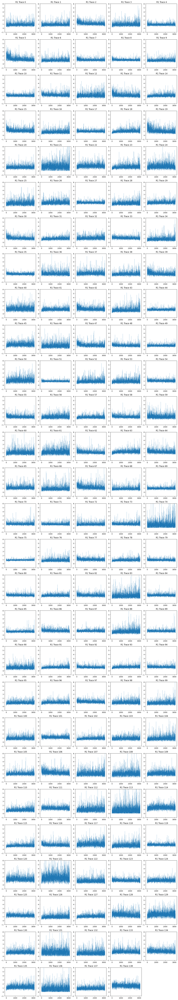

In [5]:
n_traces = mean_activity_r_1.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)


fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_r_1[i, :], lw=.25)
    axes[i].set_title(f" R1 Trace {i}")
    axes[i].set_ylim(-1, 6)
for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


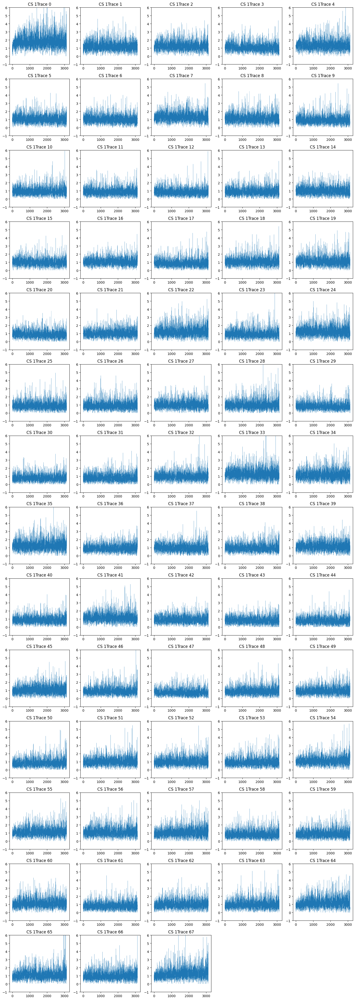

In [6]:
n_traces = mean_activity_cs_1.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_cs_1[i, :], lw=.25)
    axes[i].set_title(f"CS 1Trace {i}")
    axes[i].set_ylim(-1, 6)
for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


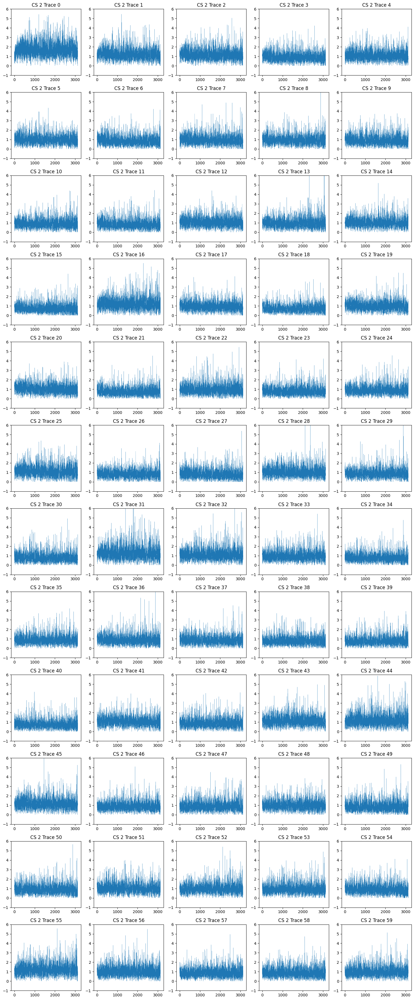

In [7]:
n_traces = mean_activity_cs_2.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)


fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_cs_2[i, :], lw=.25)
    axes[i].set_title(f"CS 2 Trace {i}")
    axes[i].set_ylim(-1, 6)

for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


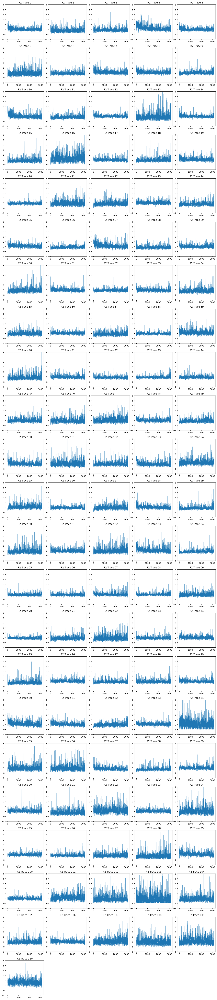

In [8]:
n_traces = mean_activity_r_2.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)


fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_r_2[i, :], lw=.25)
    axes[i].set_title(f"R2 Trace {i}")
    axes[i].set_ylim(-1, 6)

for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


# in- or decrease pattern

Neurons +1 +1 [   0  594  326   50  657  166  109  323  166  115  762  315  179  221
  355  191   79  624  214  134  364  406  325  216  213  220  463  272
  150  568  174  268  407  153   78  735  330  250  238  461  266  347
  211   93  893  179  158  445  182  338  134  314  104  438  468  181
  158  369  428  272  339  297  405  415  237  151  176  233   93  490
  167  111  216  368   39  388  141  276  109  463  277  142  253  108
  276  193  349  201   70  318   55  453  300  263  320  233  592  319
   85  202  712  233   53  239  336  826  339  176  384  226  433  443
   81  516  200   95  693  216  221 1044 1026   86  102  522  431  158
   69 1075  775  126  139  139  524  944  391  183   55 1307] Neurons 0 0 [736 146  99 114 110 136 160 285 272 272 157 148 125 152 139  94  95 147
 148  94  64  46  39  79  57  60  77 101 115 106 167 156 132  91  95 100
 144 139 124  98 112 108  95 119  95  76  61 122 238 218 184 109 120  77
 113 110 134 155 113  81  76  77  77 113 124 128  99  

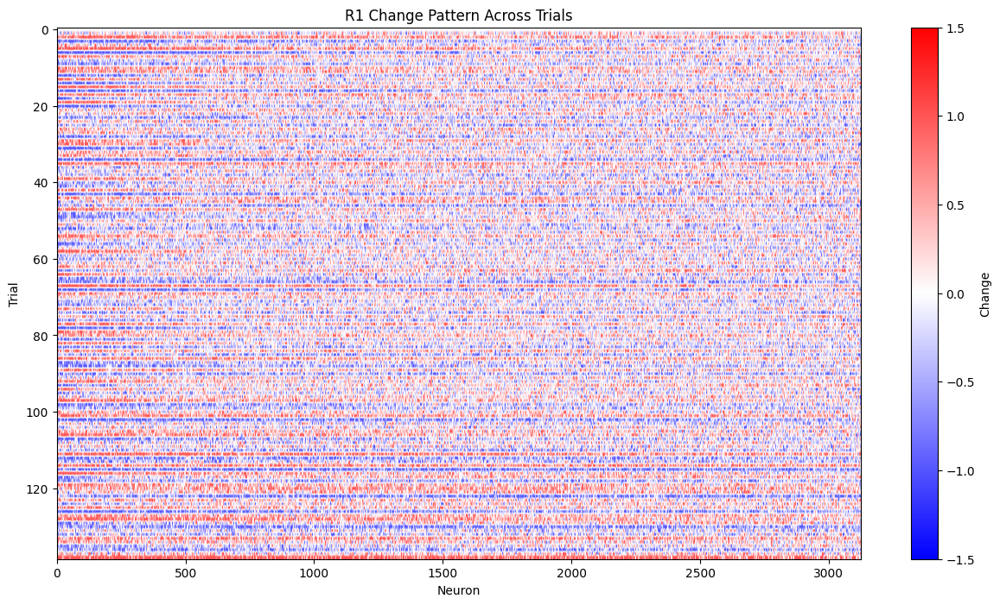

In [9]:
def compute_trial_changes(data):
    """
    Given a 2D array 'data' of shape (n_trials, n_neurons), this function:
    1. Computes the mean and standard deviation (across trials) for each neuron.
    2. Computes, for each trial (starting at trial 1), the difference from the previous trial.
    3. Marks neurons that increase more than one std with +1, 
       and those that decrease more than one std with -1.
       
    Returns:
        baseline: (n_neurons,) array of the mean activity per neuron.
        std: (n_neurons,) array of the standard deviation per neuron.
        change_marks: (n_trials, n_neurons) array with values -1, 0, or +1.
                      Trial 0 is set to all zeros (no previous trial for comparison).
    """
    n_trials, n_neurons = data.shape
    baseline = np.mean(data, axis=0)
    std = np.std(data, axis=0)
    
    # Initialize change marks: first trial gets no change info.
    change_marks = np.zeros((n_trials, n_neurons))
    
    for i in range(1, n_trials):
        diff = data[i, :] - data[i-1, :]
        # Mark +1 if increase greater than std, -1 if decrease more than std, else 0.
        #change_marks[i, :] = np.where(diff > std, 1, np.where(diff < -std, -1, 0))
        change_marks[i, :] = np.where(diff > .1, 1, np.where(diff < -.1, -1, 0))

    
    return baseline, std, change_marks

def count_consistent_changes_by_category(changes):
    """
    For each consecutive trial pair, count how many neurons maintain the same change.
    
    Parameters:
      changes: np.ndarray of shape (n_trials, n_neurons)
               Each entry should be +1 (increase), -1 (decrease), or 0 (no significant change).
    
    Returns:
      consistent_positive: np.ndarray of length (n_trials - 1) with counts of neurons that were +1 
                           in trial i-1 and remain +1 in trial i.
      consistent_zero: np.ndarray of length (n_trials - 1) with counts of neurons that were 0 
                       in trial i-1 and remain 0 in trial i.
      consistent_negative: np.ndarray of length (n_trials - 1) with counts of neurons that were -1 
                           in trial i-1 and remain -1 in trial i.
    """
    n_trials, n_neurons = changes.shape
    consistent_positive = []
    consistent_zero = []
    consistent_negative = []
    
    for i in range(1, n_trials):
        # Neurons that were +1 in trial i-1 and are also +1 in trial i.
        pos_count = np.sum((changes[i-1, :] == 1) & (changes[i, :] == 1))
        # Neurons that were 0 in trial i-1 and are also 0 in trial i.
        zero_count = np.sum((changes[i-1, :] == 0) & (changes[i, :] == 0))
        # Neurons that were -1 in trial i-1 and are also -1 in trial i.
        neg_count = np.sum((changes[i-1, :] == -1) & (changes[i, :] == -1))
        
        consistent_positive.append(pos_count)
        consistent_zero.append(zero_count)
        consistent_negative.append(neg_count)
    
    return (np.array(consistent_positive), 
            np.array(consistent_zero), 
            np.array(consistent_negative))

baseline, std, changes_r1 = compute_trial_changes(mean_activity_r_1)
pos_r1, zero_r1, neg_r1 = count_consistent_changes_by_category(changes_r1)

print("Neurons +1 +1", pos_r1, "Neurons 0 0", zero_r1, "Neurons -1 -1", neg_r1)

plt.figure(figsize=(15, 8))
plt.imshow(changes_r1, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('R1 Change Pattern Across Trials')
plt.show()




Neurons +1 +1 [  0  50 880 264 181  61 751 488 194 151  97 245 357  63 275 191 228 203
 272 187 221 154 402 217 133 251 126 138 175 532 106 243 240 230 206 638
 302  61 858 141  87 350 165 248 217 272 312 332 251 213 453 200 326 529
 404  73 148 245 182 211 251 571 281 147 112 309 261 178 242  70 364 271
 227 452 121 102 328  97 311 615 313 202 180 679  95 360 248 147 270 960
 207 167 500 352  91 224  99 144 377 347 245 263 222 176 538 618 512 208
 333 864] Neurons 0 0 [502 153  90 142 113 143 105 183 215 141 151 155  76 120  79  87  91  88
 171 195 144 119  99 107 117 115 130 150 152 151 155 187 273 146 112  77
  86 171 133 110  77 166 308 346 222 137 104 109  94 147 110 121 128  96
  95 128 139 166 141 137 204  87 102  96 211 355 365 387 268 319 220 123
 120 160 141 107 120 187 227 145 159 121 182  69  57  51 104 138 188 126
  99  68  57  64 118 114 178 168  60  95  84  68  25  45  53 100  94  57
  38  26] Neurons -1 -1 [  0 289 119 102 885 194 176 111 428 443 493 103 250  55 458 294

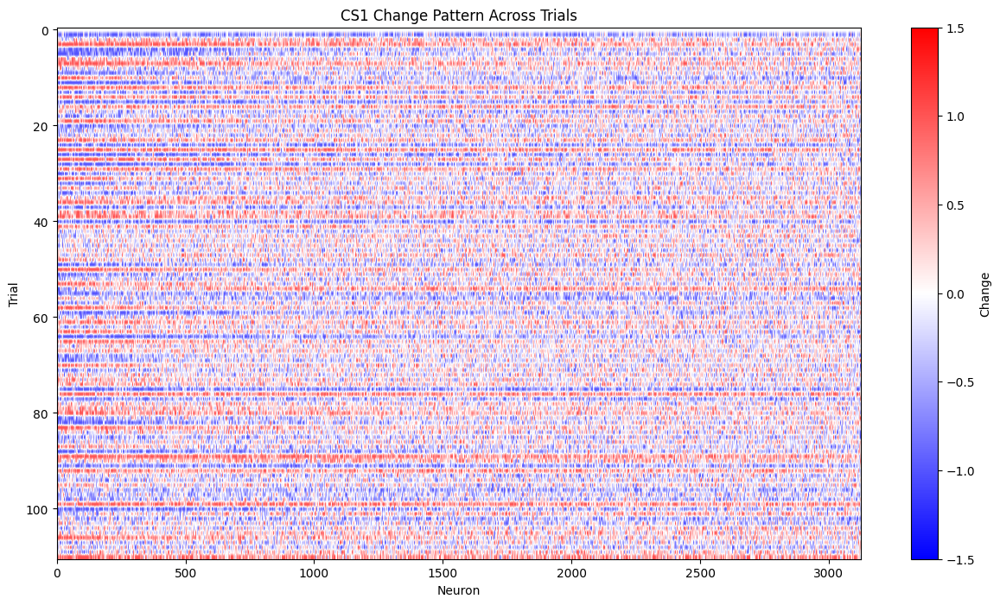

In [10]:
baseline, std, changes_r2 = compute_trial_changes(mean_activity_r_2)
pos_r2, zero_r2, neg_r2 = count_consistent_changes_by_category(changes_r2)

print("Neurons +1 +1", pos_r2, "Neurons 0 0", zero_r2, "Neurons -1 -1", neg_r2)

plt.figure(figsize=(15, 8))
plt.imshow(changes_r2, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('CS1 Change Pattern Across Trials')
plt.show()




Neurons +1 +1 [  0  87 221 338 258 150 534 328 121 170 254 260 296 419 400 367 179 285
 558 162 260 596 212 283 197 143 405 366 204 189 301 493 899 419 380 189
 204 304 529 241 300 312 133 186 525 389 157 286 457 260 404 503 225 355
 528 354 312 144 186 531 222 251 433 480 360 253 432] Neurons 0 0 [313  58  89  76  90  82  94  85  74  71 107 122 126  93  93  85  95  94
  94  95  87  67  81  82  76  68  88 110  89 100 119 101  50  51  61  62
  61  93  78  83  67  68  81 122  88  81  78 120 107 120 103  86 123 105
  95  82  69  76  66  62  80  90  98  70  88  85  85] Neurons -1 -1 [  0 744 489 287 287 602 156 225 734 459 355 408 266 216 204 306 412 296
 189 414 382 170 342 301 302 656 244 270 475 483 335 152 181 216 345 437
 596 284 219 307 280 248 677 442 188 197 652 309 185 360 232 183 420 266
 207 340 379 589 494 145 353 368 175 226 187 497 246]


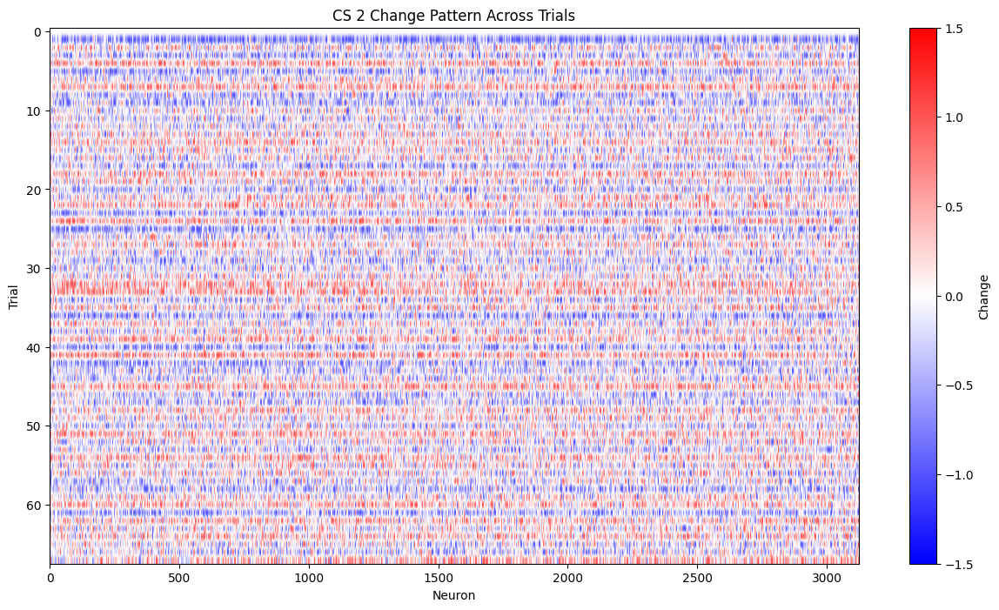

In [11]:
baseline, std, changes_cs1 = compute_trial_changes(mean_activity_cs_1)
pos_cs1, zero_cs1, neg_cs1 = count_consistent_changes_by_category(changes_cs1)

print("Neurons +1 +1", pos_cs1, "Neurons 0 0", zero_cs1, "Neurons -1 -1", neg_cs1)

    
plt.figure(figsize=(15, 8))
plt.imshow(changes_cs1, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('CS 2 Change Pattern Across Trials')
plt.show()




Neurons +1 +1 [  0 126 139 235 354 180 267 346 267 269 260 444 356 269 168 313 356  93
 271 650 131 233 252 253 655 224 170 484 377 100 516 489 201 127 244 453
 282 229 261 255 633 376 312 599 347 195 171 387 279 241 516 403 270 306
 625 333 169 208 406] Neurons 0 0 [338  64  90  99 127 100 115 122 114 123 102  89 112  88 125  69  57  55
  72  81  78  65  96  86  78  91  78 101  98 115  54  54  72  93 105 102
 132 118 131 132  80  86 100  75  83  74  78  80  81  86  91  97  95 122
  76  71  68  96 100] Neurons -1 -1 [  0 812 637 369 214 512 330 218 379 355 324 198 233 362 479 177 126 947
 225 153 575 364 225 341 159 261 629 199 275 522 178 108 658 702 334 200
 299 482 408 310 120 191 262 165 290 619 576 219 358 406 221 273 397 396
 188 186 756 470 221]


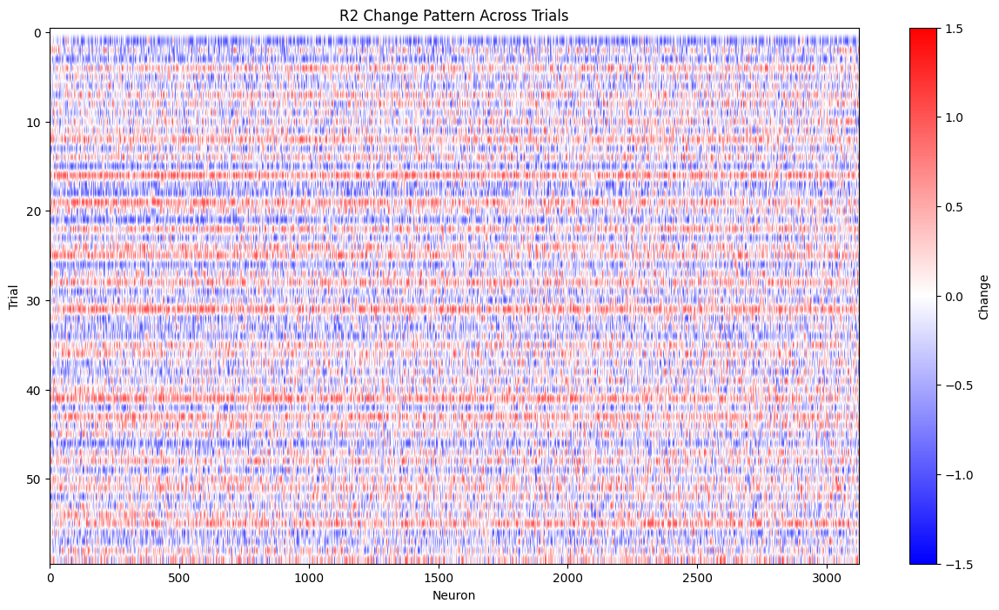

In [12]:
baseline, std, changes_cs2 = compute_trial_changes(mean_activity_cs_2)
pos_cs2, zero_cs2, neg_cs2 = count_consistent_changes_by_category(changes_cs2)

print("Neurons +1 +1", pos_cs2, "Neurons 0 0", zero_cs2, "Neurons -1 -1", neg_cs2)
    
plt.figure(figsize=(15, 8))
plt.imshow(changes_cs2, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('R2 Change Pattern Across Trials')
plt.show()



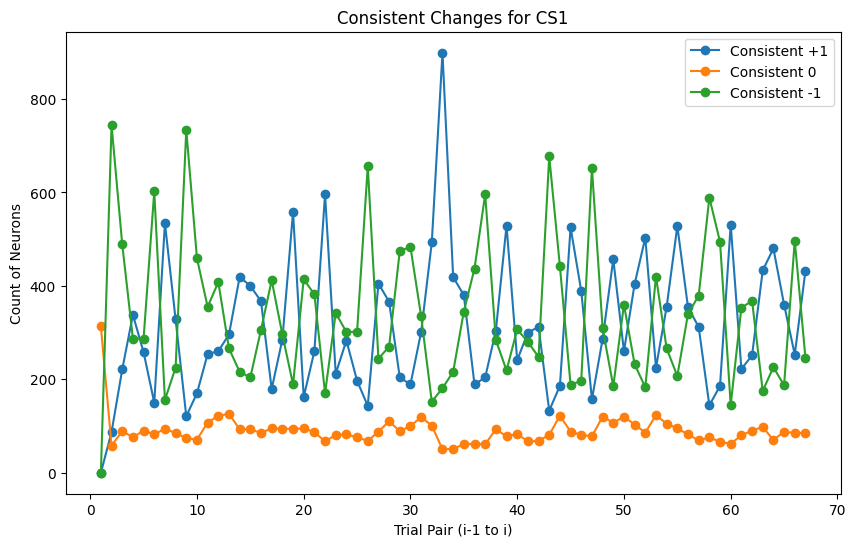

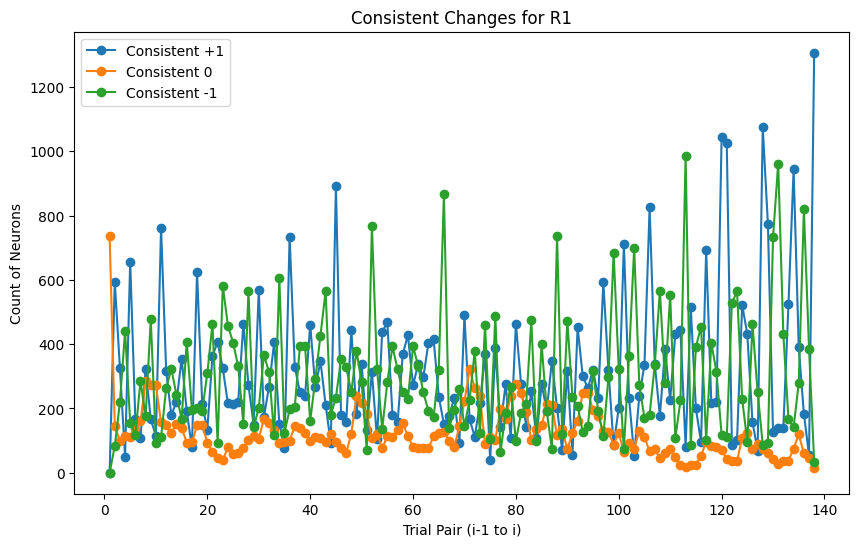

In [13]:
trial_pairs_cs1 = np.arange(1, changes_cs1.shape[0])
trial_pairs_r1 = np.arange(1, changes_r1.shape[0])


# Visualize the counts for CS condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_cs1, pos_cs1, marker='o', label='Consistent +1')
plt.plot(trial_pairs_cs1, zero_cs1, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_cs1, neg_cs1, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for CS1')
plt.legend()
plt.show()

# Visualize the counts for R condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_r1, pos_r1, marker='o', label='Consistent +1')
plt.plot(trial_pairs_r1, zero_r1, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_r1, neg_r1, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for R1')
plt.legend()
plt.show()

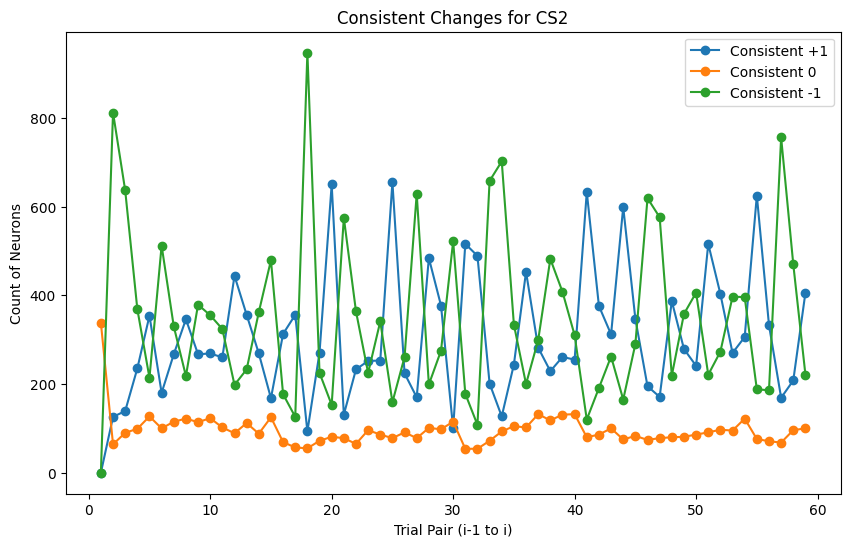

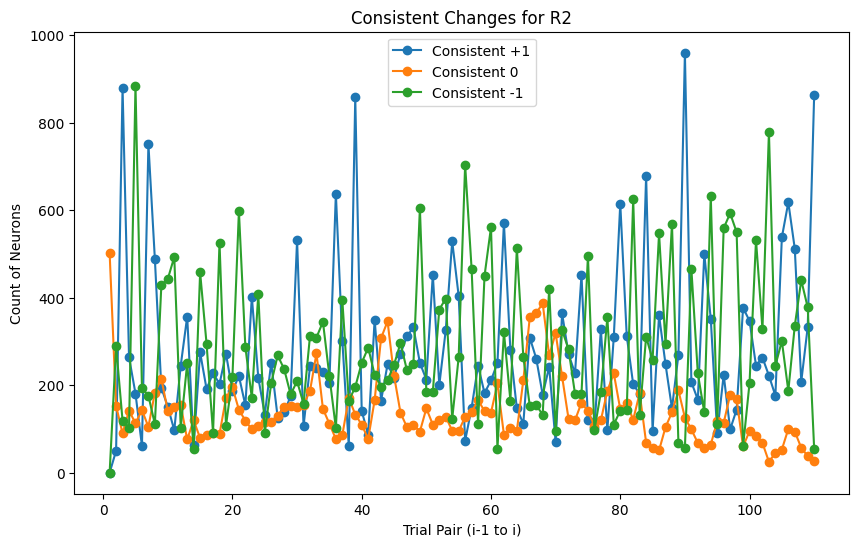

In [14]:
trial_pairs_cs2 = np.arange(1, changes_cs2.shape[0])
trial_pairs_r2 = np.arange(1, changes_r2.shape[0])


# Visualize the counts for CS condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_cs2, pos_cs2, marker='o', label='Consistent +1')
plt.plot(trial_pairs_cs2, zero_cs2, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_cs2, neg_cs2, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for CS2')
plt.legend()
plt.show()

# Visualize the counts for R condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_r2, pos_r2, marker='o', label='Consistent +1')
plt.plot(trial_pairs_r2, zero_r2, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_r2, neg_r2, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for R2')
plt.legend()
plt.show()

# cossims

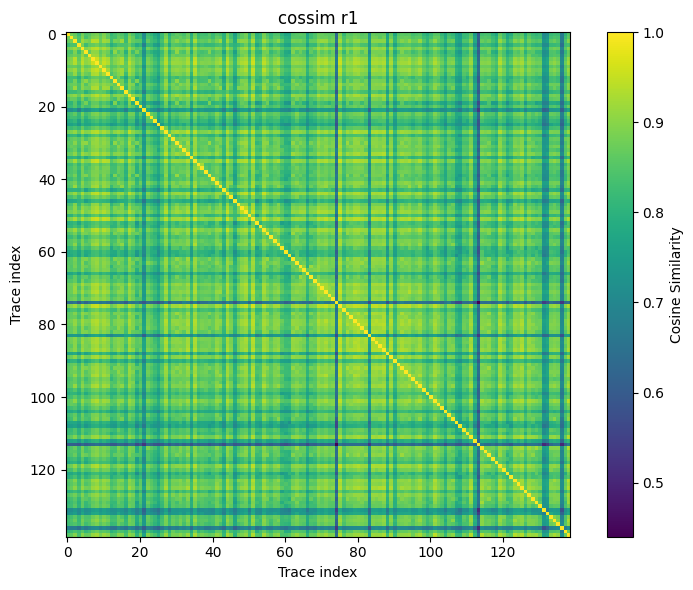

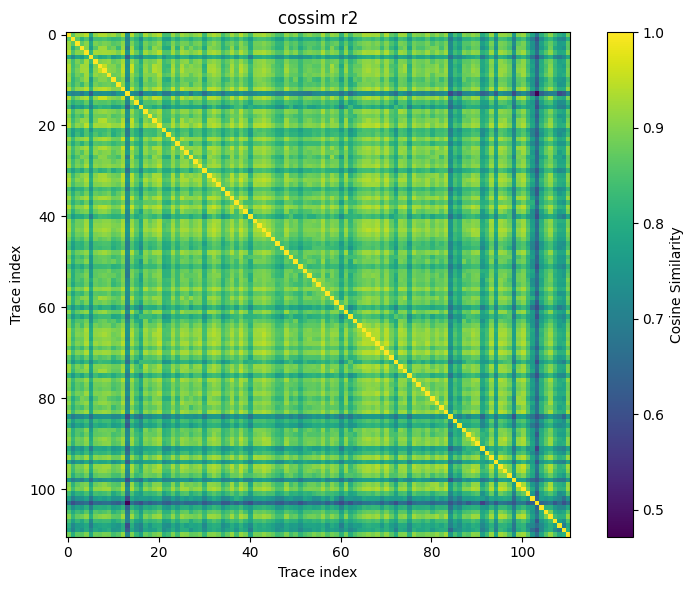

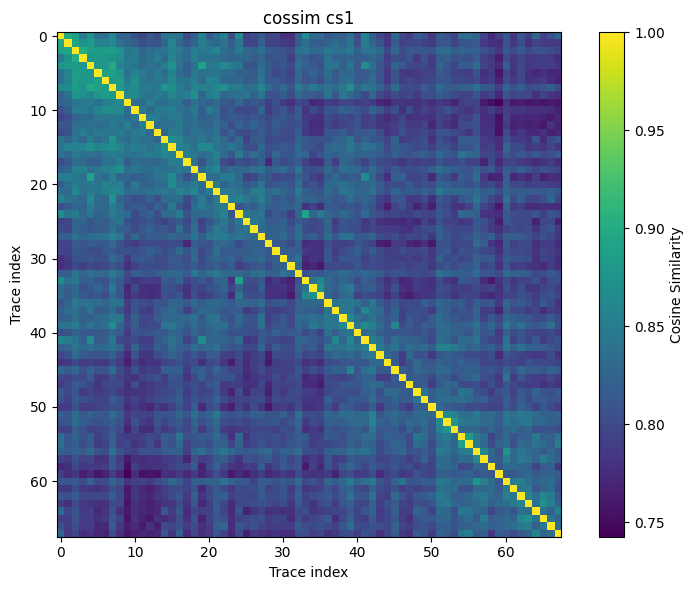

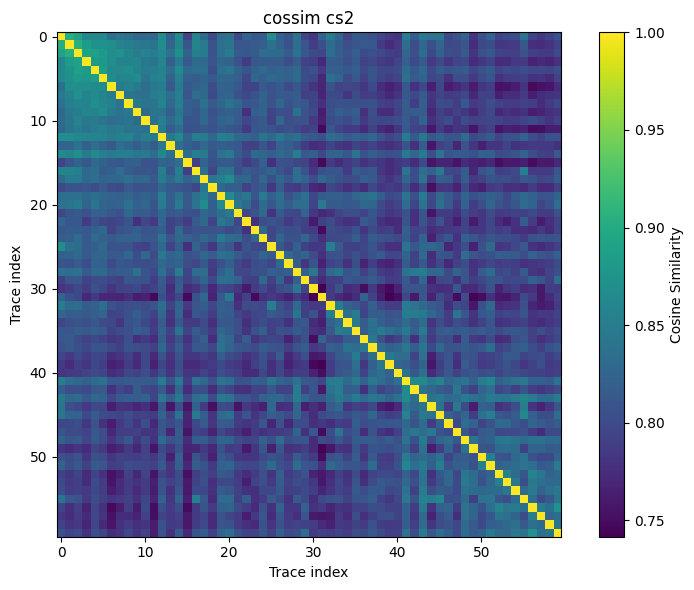

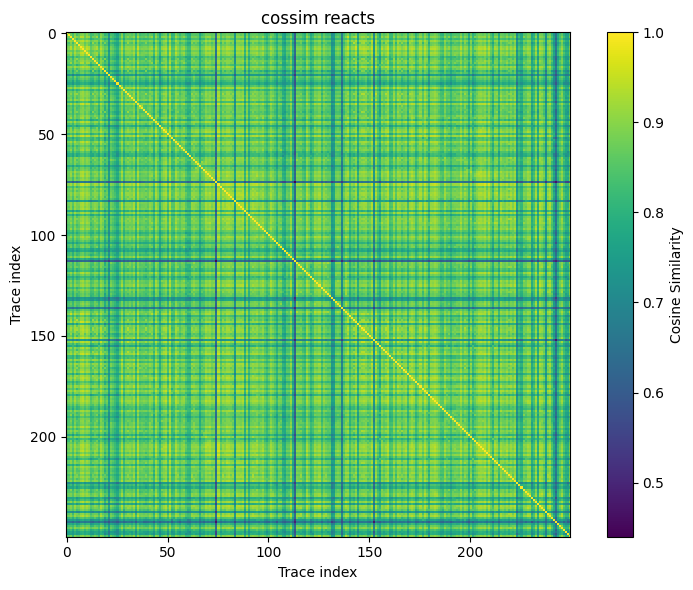

In [15]:
from sklearn.metrics.pairwise import cosine_similarity

cos_sim_matrix_r1 = cosine_similarity(mean_activity_r_1)
cos_sim_matrix_r2 = cosine_similarity(mean_activity_r_2)

cos_sim_matrix_cs1 = cosine_similarity(mean_activity_cs_1)
cos_sim_matrix_cs2 = cosine_similarity(mean_activity_cs_2)

Reacts = np.concatenate([mean_activity_r_1, mean_activity_r_2])
cos_sim_matrix_reacts = cosine_similarity(Reacts)

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_r1, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim r1')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_r2, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim r2')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_cs1, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim cs1')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_cs2, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim cs2')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()


plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_reacts, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim reacts')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()





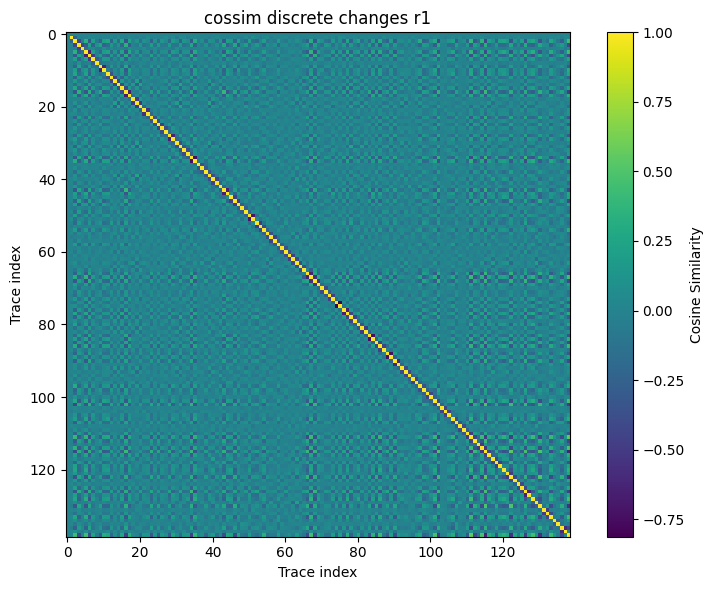

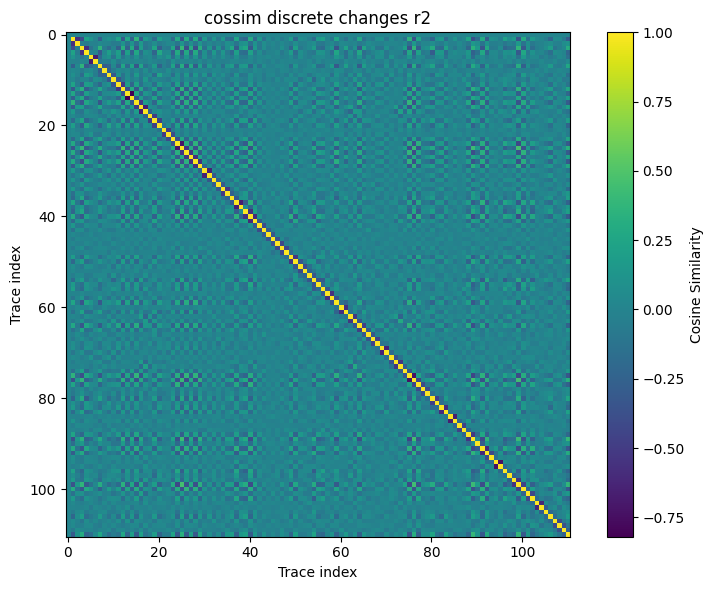

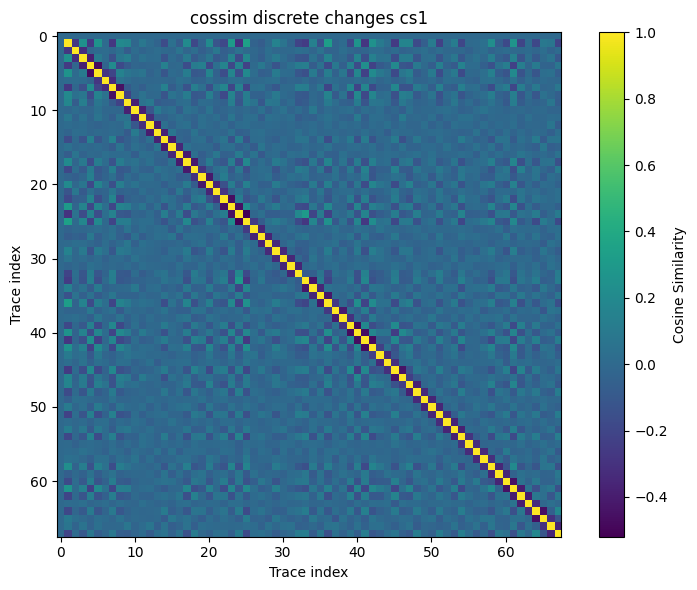

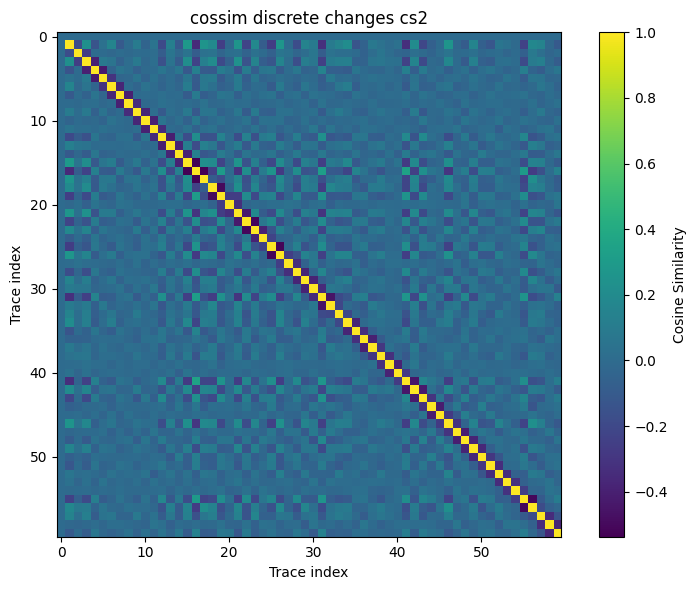

In [16]:

cos_sim_matrix_r1_changes = cosine_similarity(changes_r1)
cos_sim_matrix_r2_changes = cosine_similarity(changes_r2)

cos_sim_matrix_cs1_changes = cosine_similarity(changes_cs1)
cos_sim_matrix_cs2_changes = cosine_similarity(changes_cs2)

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_r1_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim discrete changes r1')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_r2_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim discrete changes r2')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_cs1_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim discrete changes cs1')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_cs2_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim discrete changes cs2')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()






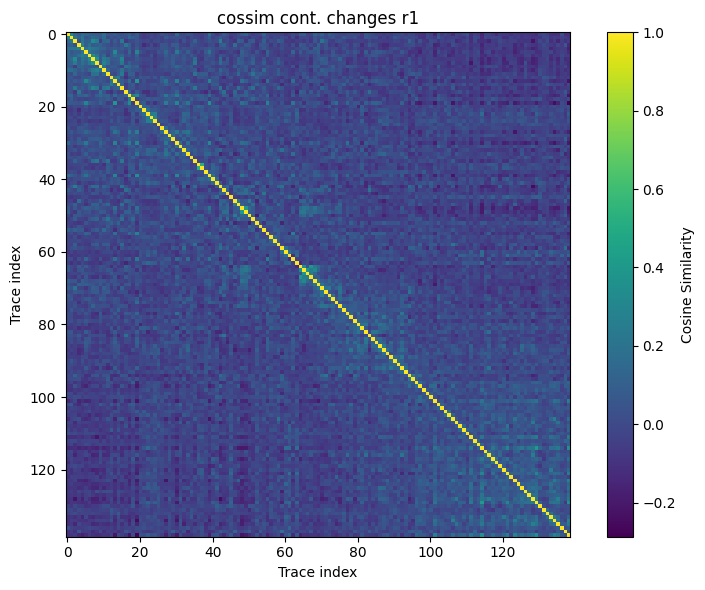

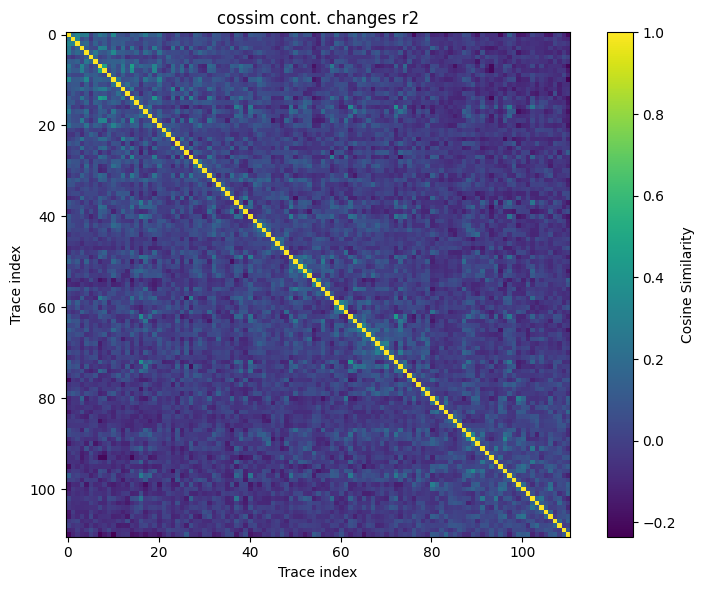

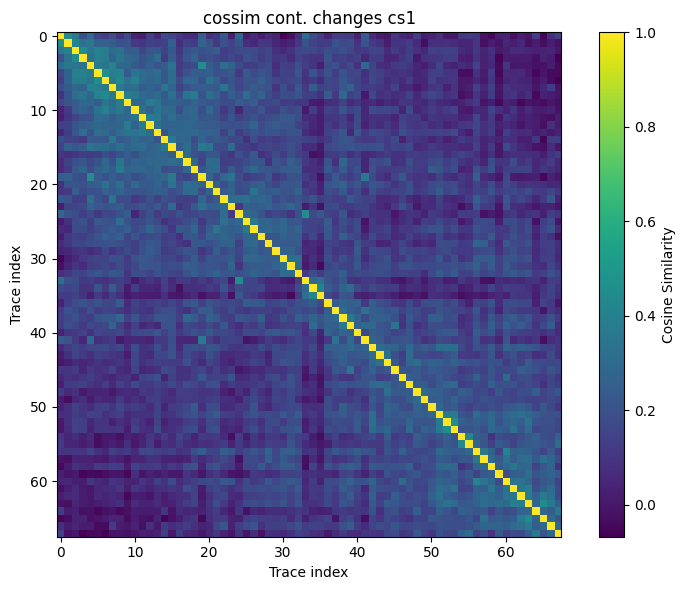

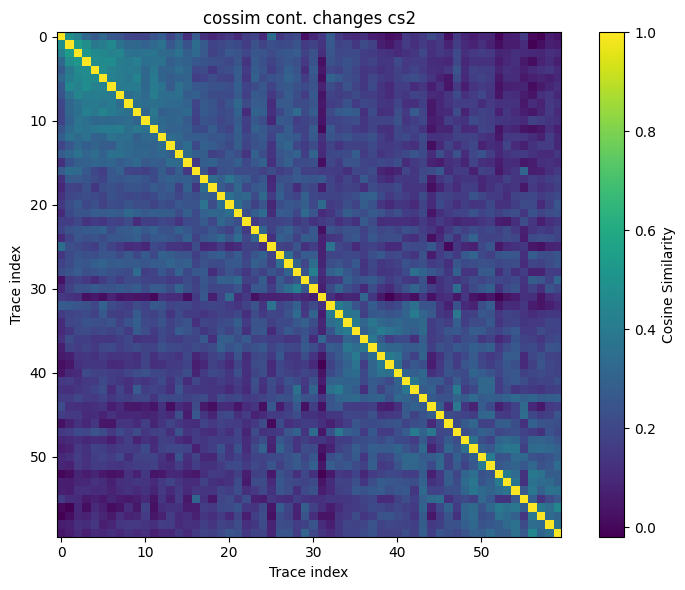

In [17]:
changes_cr1 = np.diff(mean_activity_r_1)
changes_cr2 = np.diff(mean_activity_r_2)

changes_ccs1 = np.diff(mean_activity_cs_1)
changes_ccs2 = np.diff(mean_activity_cs_2)


cos_sim_matrix_r1_changes = cosine_similarity(changes_cr1)
cos_sim_matrix_r2_changes = cosine_similarity(changes_cr2)

cos_sim_matrix_cs1_changes = cosine_similarity(changes_ccs1)
cos_sim_matrix_cs2_changes = cosine_similarity(changes_ccs2)

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_r1_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim cont. changes r1')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_r2_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim cont. changes r2')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_cs1_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim cont. changes cs1')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cos_sim_matrix_cs2_changes, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine Similarity')
plt.title('cossim cont. changes cs2')
plt.xlabel('Trace index')
plt.ylabel('Trace index')
plt.tight_layout()
plt.show()






In [18]:

sers = np.concatenate([mean_activity_cs_1, mean_activity_cs_2])

# Get the trial order from behavior
cue_codes = behavior['cue_codes']
cs1_code = behavior['cs_1_code']
cs2_code = behavior['cs_2_code']

# Count the number of CS1 and CS2 trials as per cue_codes
n_cs1 = np.sum(np.array(cue_codes) == cs1_code)
n_cs2 = np.sum(np.array(cue_codes) == cs2_code)

# Assuming sers is organized as first n_cs1 rows = CS1, then n_cs2 rows = CS2
sers_cs1 = sers[:n_cs1, :]
sers_cs2 = sers[n_cs1:n_cs1+n_cs2, :]

# Prepare counters to track which trial to take next from each group
cs1_counter = 0
cs2_counter = 0

# Initialize a list to hold the reordered data
sers_ordered = []

# Iterate over the cue_codes and pick the corresponding row from the appropriate group
for code in cue_codes:
    if code == cs1_code:
        sers_ordered.append(sers_cs1[cs1_counter])
        cs1_counter += 1
    elif code == cs2_code:
        sers_ordered.append(sers_cs2[cs2_counter])
        cs2_counter += 1
    else:
        # Optionally handle unexpected codes here
        pass

# Convert list to numpy array
sers_ordered = np.array(sers_ordered)

# Now sers_ordered has rows in the same order as behavior['cue_codes']
print("Reordered SER data shape:", sers_ordered.shape)

#print(behavior['cue_codes'])


Reordered SER data shape: (128, 3124)


In [19]:
all_trials = np.concatenate([trial_r_1, trial_r_2])
all_reacts = np.concatenate([mean_activity_r_1, mean_activity_r_2], axis=0)

# Obtain ordering indices that sort the trials (using a stable sort to preserve order within each trial)
order_idx = np.argsort(all_trials, kind='mergesort')

# Reorder the reactivation data based on the trial order
reacts_ordered = all_reacts[order_idx, :]

print("Reordered reacts shape:", reacts_ordered.shape)

Reordered reacts shape: (250, 3124)


t-SNE Analysis for Reactivation Data:



t-SNE Analysis for SER Data:
t-SNE results shapes: (250, 2) (128, 2)


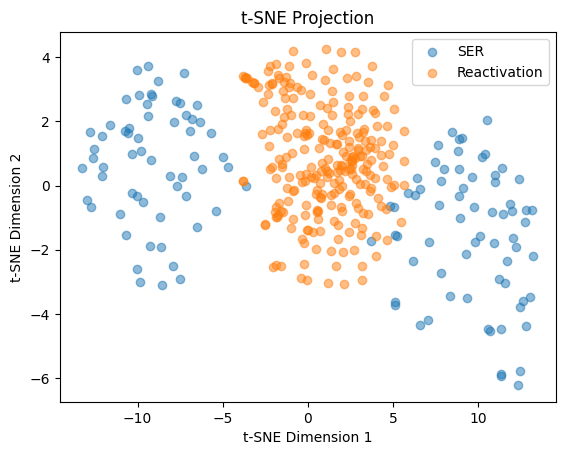

In [20]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

# Function to perform t-SNE on input data
def perform_tsne(data, n_components=2, perplexity=30, random_state=42):
    """
    Performs t-SNE on the input data.

    Parameters:
    - data: 2D numpy array (samples, features)
    - n_components: number of dimensions for the embedding (default = 2)
    - perplexity: t-SNE perplexity parameter (default = 30)
    - random_state: seed for reproducibility (default = 42)

    Returns:
    - tsne_results: 2D numpy array containing the t-SNE embedding
    """

    # Standardize the data: scaling helps t-SNE by ensuring all features contribute equally.
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    # Perform t-SNE
    tsne = TSNE(n_components=n_components, perplexity=perplexity, random_state=random_state)
    tsne_results = tsne.fit_transform(data_scaled)

    return tsne_results

# Example usage:
print("t-SNE Analysis for Reactivation Data:")
reactivation_tsne = perform_tsne(reacts_ordered)

print("\nt-SNE Analysis for SER Data:")
ser_tsne = perform_tsne(sers_ordered)

print("t-SNE results shapes:", reactivation_tsne.shape, ser_tsne.shape)

# Plotting the t-SNE results (using the first two dimensions)
plt.scatter(ser_tsne[:, 0], ser_tsne[:, 1], alpha=0.5, label="SER")
plt.scatter(reactivation_tsne[:, 0], reactivation_tsne[:, 1], alpha=0.5, label="Reactivation")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend()
plt.title("t-SNE Projection")
plt.show()


t-SNE Analysis for all dat:


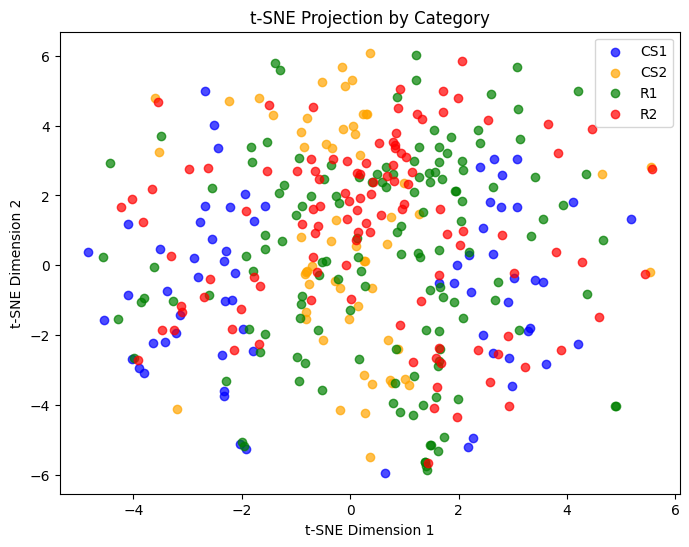

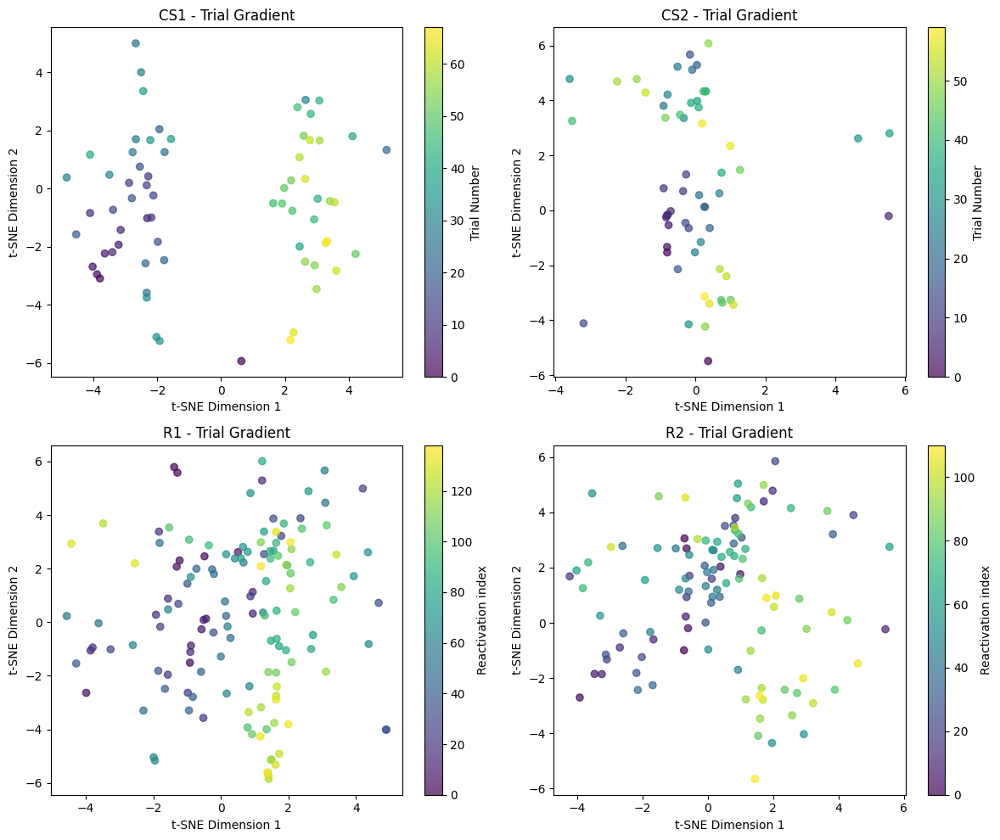

In [21]:
reacts = np.concatenate([mean_activity_r_1, mean_activity_r_2])
all_dat = np.concatenate([sers, reacts])
print("t-SNE Analysis for all dat:")
all_dat_tsne = perform_tsne(all_dat)

# number of samples per category
n_cs1 = mean_activity_cs_1.shape[0]
n_cs2 = mean_activity_cs_2.shape[0]
n_r1  = mean_activity_r_1.shape[0]
n_r2  = mean_activity_r_2.shape[0]

# Extract the t-SNE projections for each category based on the concatenation order
cs1_tsne = all_dat_tsne[:n_cs1, :]
cs2_tsne = all_dat_tsne[n_cs1:n_cs1+n_cs2, :]
r1_tsne  = all_dat_tsne[n_cs1+n_cs2:n_cs1+n_cs2+n_r1, :]
r2_tsne  = all_dat_tsne[n_cs1+n_cs2+n_r1:, :]

# different colors for each category
plt.figure(figsize=(8, 6))
plt.scatter(cs1_tsne[:, 0], cs1_tsne[:, 1], alpha=0.7, label="CS1", color='blue')
plt.scatter(cs2_tsne[:, 0], cs2_tsne[:, 1], alpha=0.7, label="CS2", color='orange')
plt.scatter(r1_tsne[:, 0],  r1_tsne[:, 1],  alpha=0.7, label="R1",  color='green')
plt.scatter(r2_tsne[:, 0],  r2_tsne[:, 1],  alpha=0.7, label="R2",  color='red')
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.title("t-SNE Projection by Category")
plt.legend()
plt.show()

# trial gradient for each category
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# CS1: Color by trial order (using np.arange for trial indices)
sc = axs[0, 0].scatter(cs1_tsne[:, 0], cs1_tsne[:, 1],
                         c=np.arange(n_cs1), cmap='viridis', alpha=0.7)
axs[0, 0].set_title("CS1 - Trial Gradient")
axs[0, 0].set_xlabel("t-SNE Dimension 1")
axs[0, 0].set_ylabel("t-SNE Dimension 2")
plt.colorbar(sc, ax=axs[0, 0], label="Trial Number")

# CS2
sc = axs[0, 1].scatter(cs2_tsne[:, 0], cs2_tsne[:, 1],
                         c=np.arange(n_cs2), cmap='viridis', alpha=0.7)
axs[0, 1].set_title("CS2 - Trial Gradient")
axs[0, 1].set_xlabel("t-SNE Dimension 1")
axs[0, 1].set_ylabel("t-SNE Dimension 2")
plt.colorbar(sc, ax=axs[0, 1], label="Trial Number")

# R1
sc = axs[1, 0].scatter(r1_tsne[:, 0], r1_tsne[:, 1],
                         c=np.arange(n_r1), cmap='viridis', alpha=0.7)
axs[1, 0].set_title("R1 - Trial Gradient")
axs[1, 0].set_xlabel("t-SNE Dimension 1")
axs[1, 0].set_ylabel("t-SNE Dimension 2")
plt.colorbar(sc, ax=axs[1, 0], label="Reactivation index")

# R2
sc = axs[1, 1].scatter(r2_tsne[:, 0], r2_tsne[:, 1],
                         c=np.arange(n_r2), cmap='viridis', alpha=0.7)
axs[1, 1].set_title("R2 - Trial Gradient")
axs[1, 1].set_xlabel("t-SNE Dimension 1")
axs[1, 1].set_ylabel("t-SNE Dimension 2")
plt.colorbar(sc, ax=axs[1, 1], label="Reactivation index")

plt.tight_layout()
plt.show()




In [22]:
print(sers_ordered.shape, reacts_ordered.shape)

(128, 3124) (250, 3124)


In [24]:
print(sers_ordered.shape)

(128, 3124)


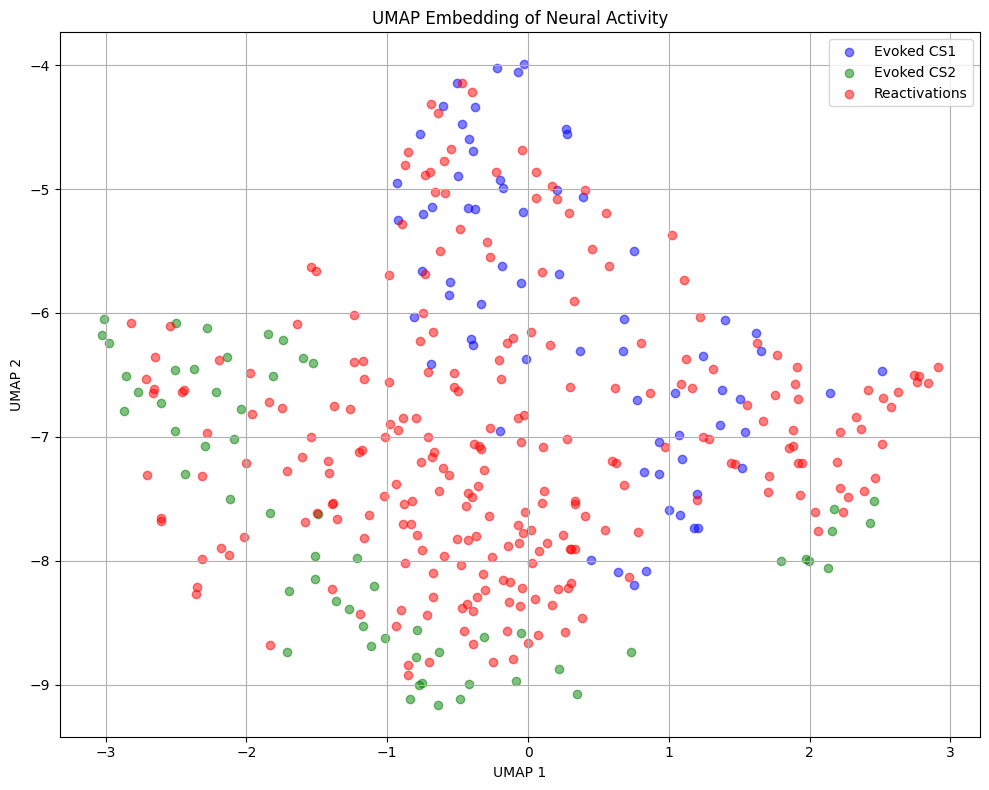

In [25]:
import umap.umap_ as umap

# Combine data for UMAP
all_data = np.vstack([
    mean_activity_cs_1, 
    mean_activity_cs_2, 
    reacts_ordered
])

labels = (
    ['evoked_cs1'] * len(mean_activity_cs_1) +
    ['evoked_cs2'] * len(mean_activity_cs_2) +
    ['reactivation'] * len(reacts_ordered)
)

# UMAP Embedding
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
embedding = reducer.fit_transform(all_data)

# Split the embedding into three groups
evoked_cs1_emb = embedding[:len(mean_activity_cs_1)]
evoked_cs2_emb = embedding[len(mean_activity_cs_1):len(mean_activity_cs_1) + len(mean_activity_cs_2)]
react_emb = embedding[len(mean_activity_cs_1) + len(mean_activity_cs_2):]

plt.figure(figsize=(10,8))

# Scatter plots for each category with distinct colors
plt.scatter(evoked_cs1_emb[:, 0], evoked_cs1_emb[:, 1], alpha=0.5, label='Evoked CS1', color='blue')
plt.scatter(evoked_cs2_emb[:, 0], evoked_cs2_emb[:, 1], alpha=0.5, label='Evoked CS2', color='green')
plt.scatter(react_emb[:, 0], react_emb[:, 1], alpha=0.5, label='Reactivations', color='red')

plt.legend()
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('UMAP Embedding of Neural Activity')
plt.grid(True)
plt.tight_layout()
plt.show()


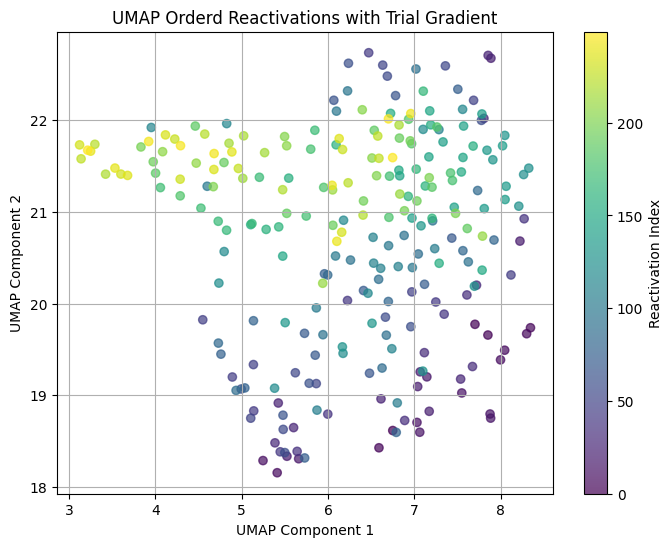

In [26]:
trial_numbers  = np.arange(reacts_ordered.shape[0])
reacts_embedding = reducer.fit_transform(reacts_ordered)

plt.figure(figsize=(8, 6))
sc = plt.scatter(reacts_embedding[:, 0], reacts_embedding[:, 1],
                 c=trial_numbers, cmap='viridis', alpha=0.7)
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP Orderd Reactivations with Trial Gradient')
cbar = plt.colorbar(sc)
cbar.set_label('Reactivation Index')
plt.grid(True)
plt.show()


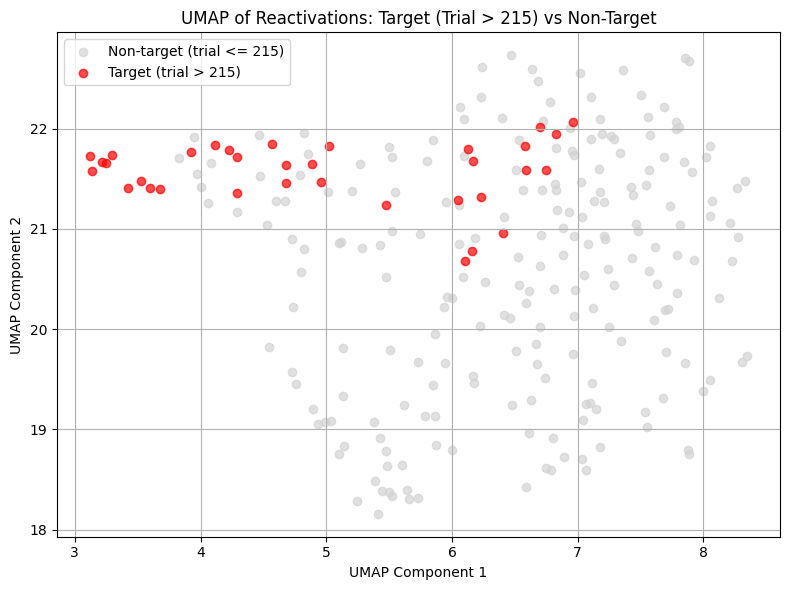

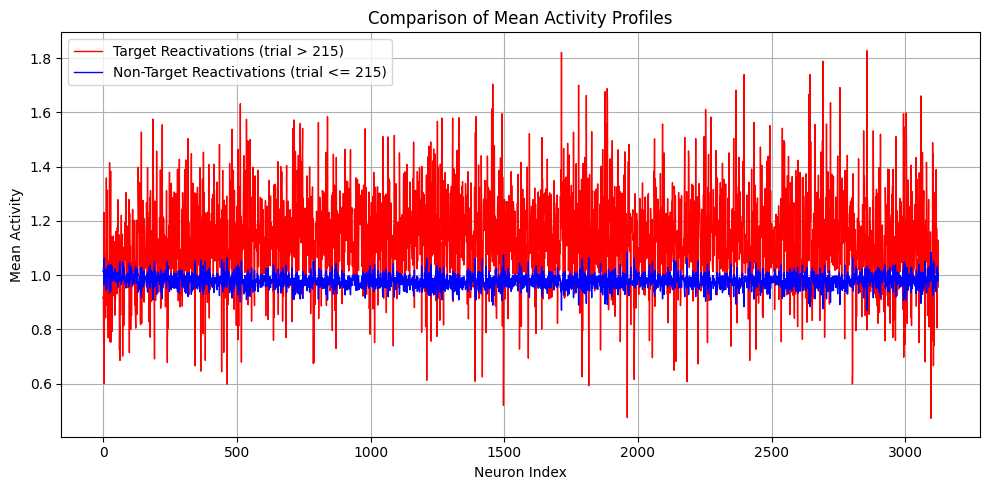

In [27]:
import umap.umap_ as umap
import matplotlib.pyplot as plt
import numpy as np

# Assume 'reacts_ordered' is your ordered reactivation data
# and the UMAP reducer has been initialized (e.g., with n_neighbors=15, min_dist=0.1, etc.)

# Create trial numbers for each reactivation event
trial_numbers = np.arange(reacts_ordered.shape[0])

# Compute UMAP embedding for the reactivations
reacts_embedding = reducer.fit_transform(reacts_ordered)

# Define target events as those from trials > 220
target_mask = trial_numbers > 215

# Plot the UMAP embedding with target and non-target points
plt.figure(figsize=(8, 6))
plt.scatter(reacts_embedding[~target_mask, 0], reacts_embedding[~target_mask, 1],
            c='lightgray', alpha=0.7, label='Non-target (trial <= 215)')
plt.scatter(reacts_embedding[target_mask, 0], reacts_embedding[target_mask, 1],
            c='red', alpha=0.7, label='Target (trial > 215)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP of Reactivations: Target (Trial > 215) vs Non-Target')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

non_target_mask = ~target_mask

# Separate the reactivation events into target and non-target groups
target_reacts = reacts_ordered[target_mask]
non_target_reacts = reacts_ordered[non_target_mask]

# Compute the mean activity profile for each group
mean_target_activity = np.mean(target_reacts, axis=0)
mean_non_target_activity = np.mean(non_target_reacts, axis=0)

# Plot the mean activity profiles
plt.figure(figsize=(10, 5))
plt.plot(mean_target_activity, label='Target Reactivations (trial > 215)', color='red', linewidth=1)
plt.plot(mean_non_target_activity, label='Non-Target Reactivations (trial <= 215)', color='blue', linewidth=1)
plt.xlabel('Neuron Index')
plt.ylabel('Mean Activity')
plt.title('Comparison of Mean Activity Profiles')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




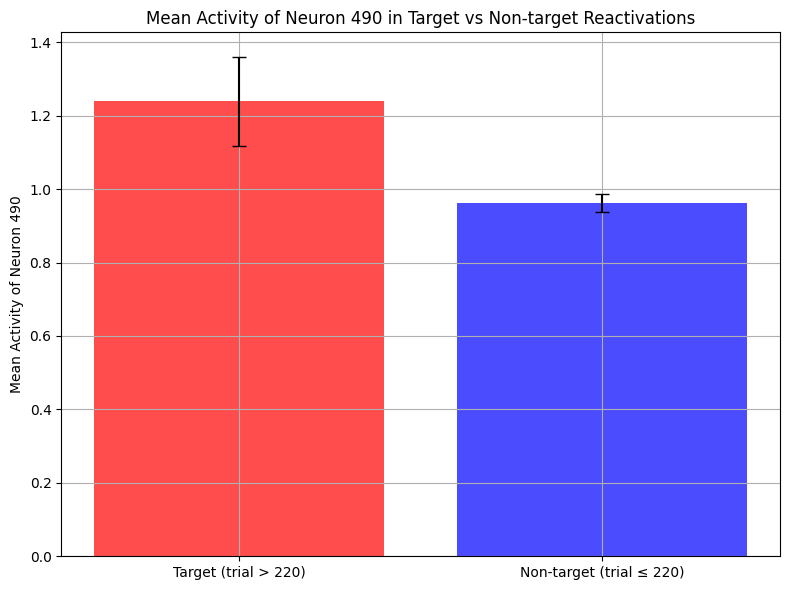

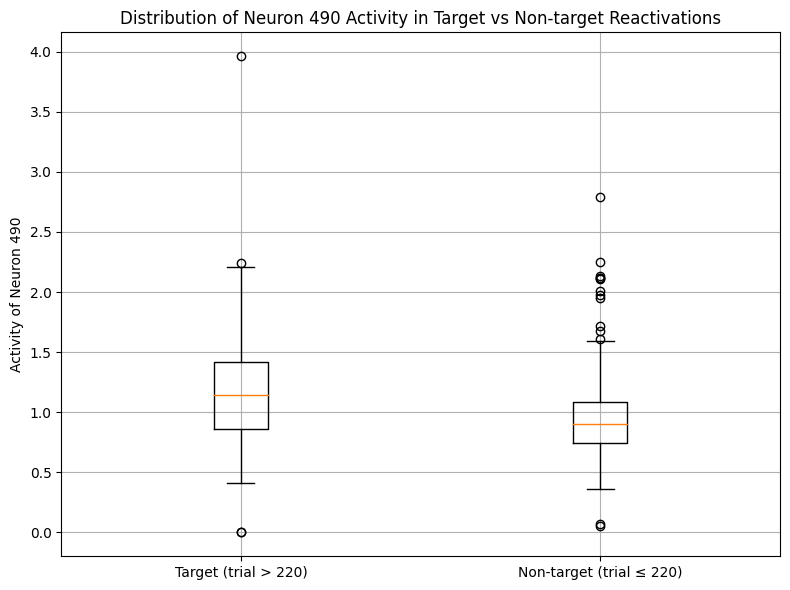

In [28]:
neuron_idx = 2859

target_neuron_activity = target_reacts[:, neuron_idx]
non_target_neuron_activity = non_target_reacts[:, neuron_idx]

# Compute statistics: mean and standard error of the mean (SEM)
mean_target = np.mean(target_neuron_activity)
sem_target = np.std(target_neuron_activity) / np.sqrt(len(target_neuron_activity))

mean_non_target = np.mean(non_target_neuron_activity)
sem_non_target = np.std(non_target_neuron_activity) / np.sqrt(len(non_target_neuron_activity))

plt.figure(figsize=(8, 6))
plt.bar(['Target (trial > 220)', 'Non-target (trial ≤ 220)'],
        [mean_target, mean_non_target],
        yerr=[sem_target, sem_non_target],
        color=['red', 'blue'], alpha=0.7, capsize=5)
plt.ylabel('Mean Activity of Neuron 490')
plt.title('Mean Activity of Neuron 490 in Target vs Non-target Reactivations')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.boxplot([target_neuron_activity, non_target_neuron_activity],
            labels=['Target (trial > 220)', 'Non-target (trial ≤ 220)'])
plt.ylabel('Activity of Neuron 490')
plt.title('Distribution of Neuron 490 Activity in Target vs Non-target Reactivations')
plt.grid(True)
plt.tight_layout()
plt.show()


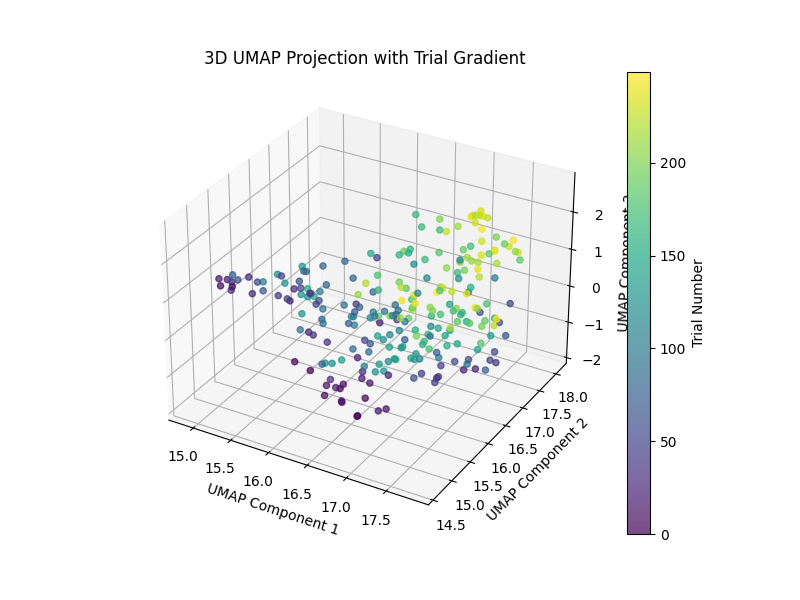

In [29]:
from mpl_toolkits.mplot3d import Axes3D
%matplotlib widget

umap_model_reac = umap.UMAP(n_components=3, n_neighbors=15, min_dist=.1, random_state=42)
umap_embedding_reac = umap_model_reac.fit_transform(reacts_ordered)

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(umap_embedding_reac[:, 0], umap_embedding_reac[:, 1],
                umap_embedding_reac[:, 2],
                c=trial_numbers, cmap='viridis', alpha=0.7)
ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')
ax.set_title('3D UMAP Projection with Trial Gradient')
plt.colorbar(sc, label='Trial Number')
plt.show()



(2,)


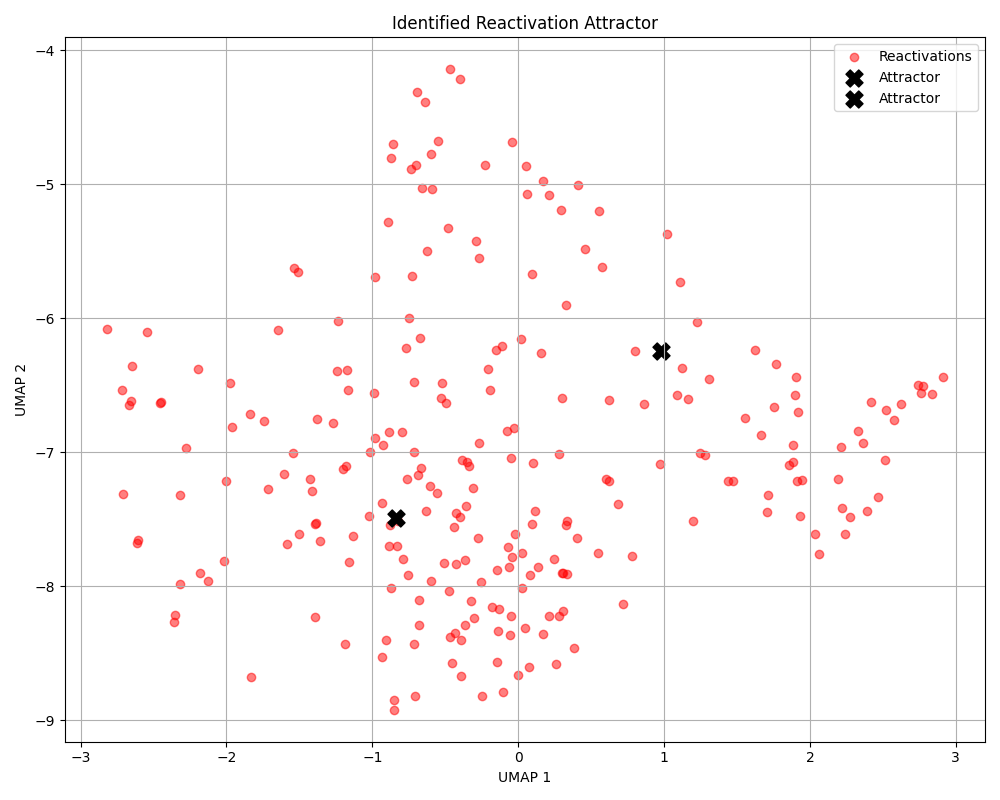

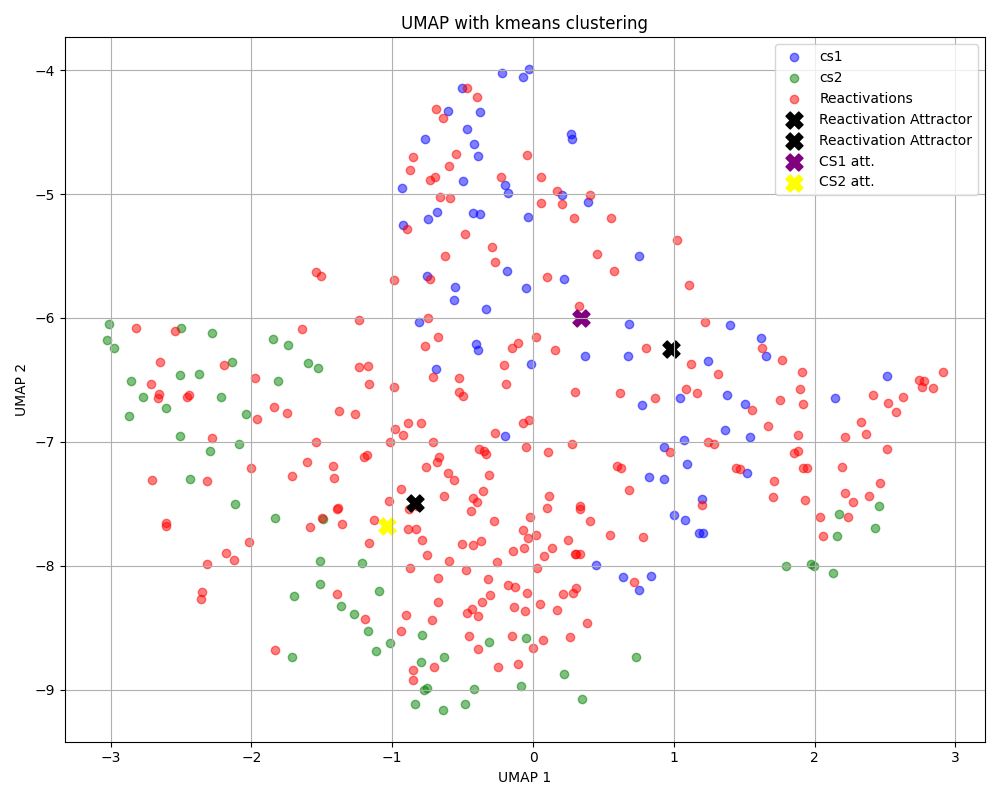

In [37]:
from sklearn.cluster import KMeans

# KMeans to find 'attractors' in reactivations
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(react_emb)

kmeans_cs1 = KMeans(n_clusters= 1, random_state=42)
kmeans_cs1.fit(evoked_cs1_emb)

kmeans_cs2 = KMeans(n_clusters= 1, random_state=42)
kmeans_cs2.fit(evoked_cs2_emb)

attractor1 = kmeans.cluster_centers_[0]
attractor2 = kmeans.cluster_centers_[1]

cs1_attractor= kmeans_cs1.cluster_centers_[0]
cs2_attractor= kmeans_cs2.cluster_centers_[0]

print(cs1_attractor.shape)


plt.figure(figsize=(10,8))
plt.scatter(react_emb[:,0], react_emb[:,1], alpha=0.5, color='red', label='Reactivations')
plt.scatter(attractor1[0], attractor1[1], color='black', marker='X', s=150, label='Attractor')
plt.scatter(attractor2[0], attractor2[1], color='black', marker='X', s=150, label='Attractor')

plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.title('Identified Reactivation Attractor')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,8))
plt.scatter(evoked_cs1_emb[:,0], evoked_cs1_emb[:,1], alpha=0.5, color='blue', label='cs1')
plt.scatter(evoked_cs2_emb[:,0], evoked_cs2_emb[:,1], alpha=0.5, color='green', label='cs2')
plt.scatter(react_emb[:,0], react_emb[:,1], alpha=0.5, color='red', label='Reactivations')
plt.scatter(attractor1[0], attractor1[1], color='black', marker='X', s=150, label='Reactivation Attractor')
plt.scatter(attractor2[0], attractor2[1], color='black', marker='X', s=150, label='Reactivation Attractor')
plt.scatter(cs1_attractor[0], cs1_attractor[1], color='purple', marker='X', s=150, label='CS1 att.')
plt.scatter(cs2_attractor[0], cs2_attractor[1], color='yellow', marker='X', s=150, label='CS2 att.')


plt.legend()
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('UMAP with kmeans clustering')
plt.grid(True)
plt.tight_layout()
plt.show()

umap_embedding_reac shape: (128, 2)
Number of labels: 128


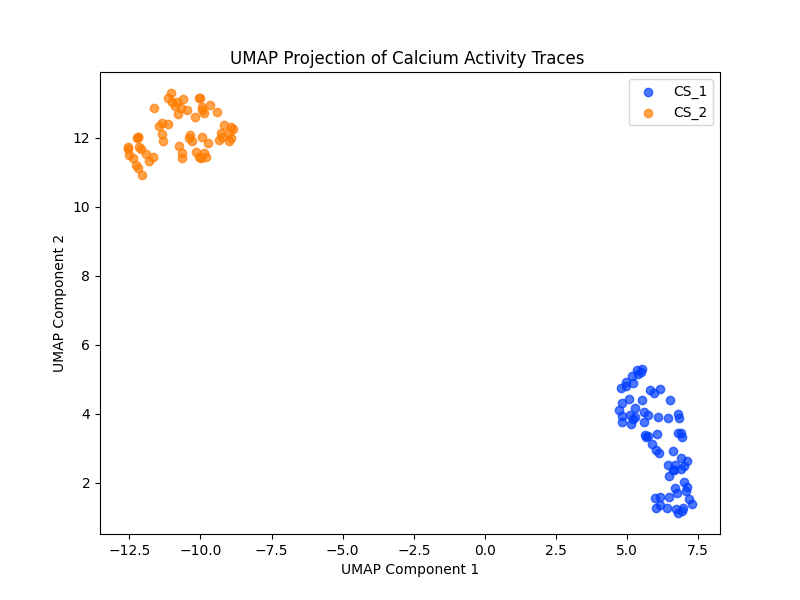

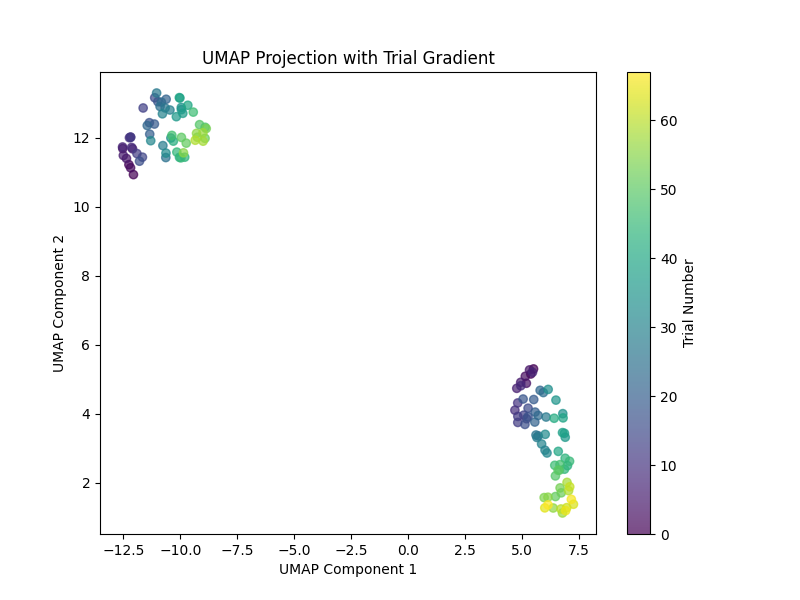

In [45]:
#UMAP on SERs only
SERs = np.concatenate([mean_activity_cs_1, mean_activity_cs_2])
umap_embedding_ser = reducer.fit_transform(SERs)

labels_cs = (['CS_1']  * mean_activity_cs_1.shape[0] +
          ['CS_2']  * mean_activity_cs_2.shape[0])

trial_numbers_cs1 = np.arange(mean_activity_cs_1.shape[0])
trial_numbers_cs2 = np.arange(mean_activity_cs_2.shape[0])
trial_numbers_cs = np.concatenate([trial_numbers_cs1, trial_numbers_cs2])


palette = sns.color_palette("bright", 4)
color_dict_cs = {'CS_1': palette[0], 'CS_2': palette[1]}


print("umap_embedding_reac shape:", umap_embedding_ser.shape)
print("Number of labels:", len(labels_cs))

plt.figure(figsize=(8, 6))
for cat in np.unique(labels_cs):
    idx = [i for i, lab in enumerate(labels_cs) if lab == cat]
    plt.scatter(umap_embedding_ser[idx, 0], umap_embedding_ser[idx, 1],
                color=color_dict_cs[cat], label=cat, alpha=0.7)
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP Projection of Calcium Activity Traces ')
plt.legend()
plt.show()

plt.figure(figsize=(8, 6))
sc = plt.scatter(umap_embedding_ser[:, 0], umap_embedding_ser[:, 1],
                 c=trial_numbers_cs, cmap='viridis', alpha=0.7)
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP Projection with Trial Gradient')
cbar = plt.colorbar(sc)
cbar.set_label('Trial Number')
plt.show()



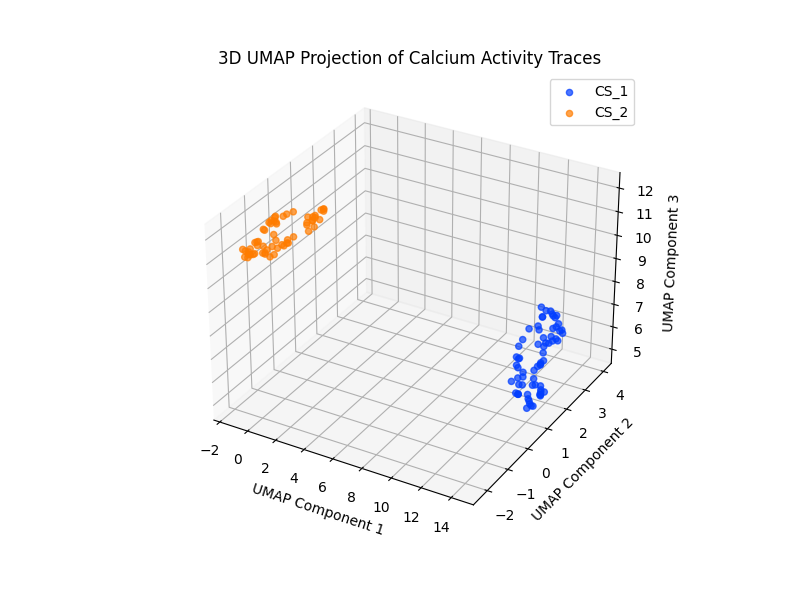

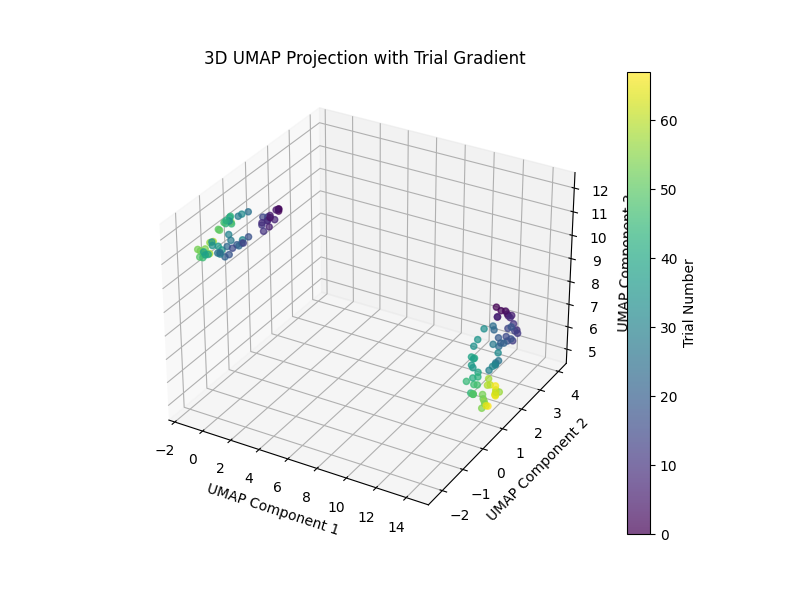

In [50]:
%matplotlib widget

umap_model_ser = umap.UMAP(n_components=3, n_neighbors=15, min_dist=.1, random_state=42)
umap_embedding_ser = umap_model_ser.fit_transform(SERs)

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

for cat in np.unique(labels_cs):
    idx = [i for i, lab in enumerate(labels_cs) if lab == cat]
    ax.scatter(umap_embedding_ser[idx, 0], umap_embedding_ser[idx, 1],
               umap_embedding_ser[idx, 2],
               color=color_dict_cs[cat], label=cat, alpha=0.7)

ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')
ax.set_title('3D UMAP Projection of Calcium Activity Traces')
ax.legend()
plt.show()

umap_model_ser = umap.UMAP(n_components=3, n_neighbors=15, min_dist=.1, random_state=42)
umap_embedding_ser = umap_model_ser.fit_transform(SERs)

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(umap_embedding_ser[:, 0], umap_embedding_ser[:, 1],
                umap_embedding_ser[:, 2],
                c=trial_numbers_cs, cmap='viridis', alpha=0.7)
ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')
ax.set_title('3D UMAP Projection with Trial Gradient')
plt.colorbar(sc, label='Trial Number')
plt.show()



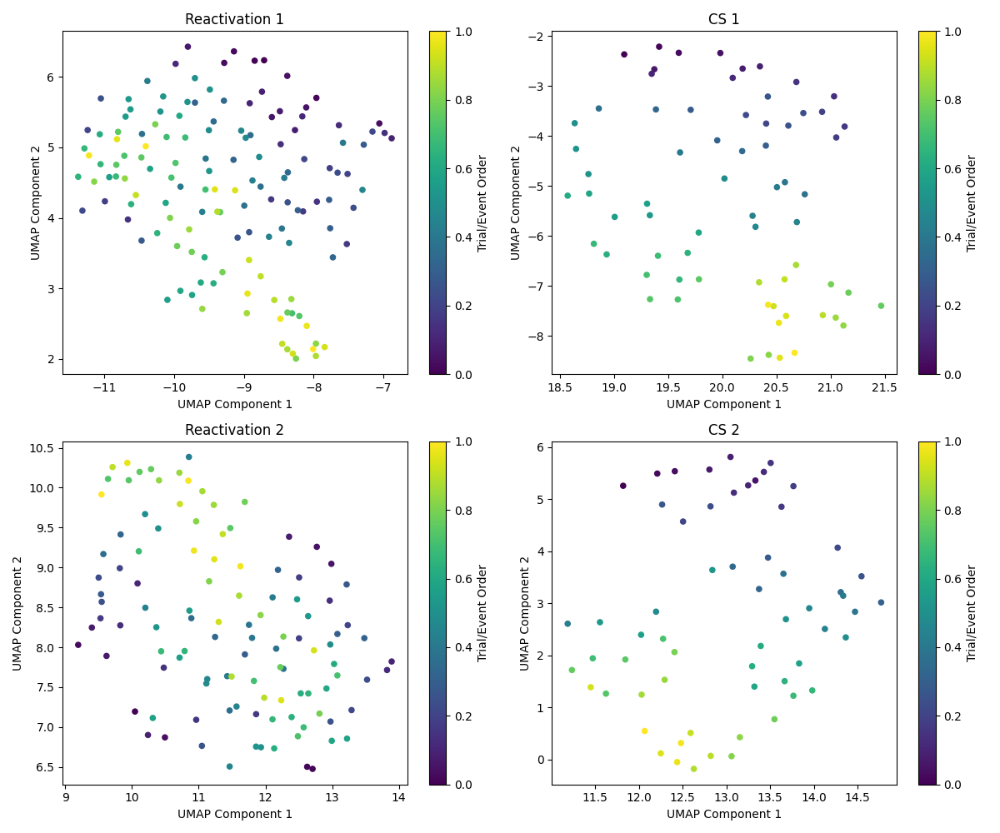

In [51]:
#UMAP per category

umap_embedding_r_1  = reducer.fit_transform(mean_activity_r_1)

umap_embedding_cs_1 = reducer.fit_transform(mean_activity_cs_1)

umap_embedding_r_2 = reducer.fit_transform(mean_activity_r_2)

umap_embedding_cs_2 = reducer.fit_transform(mean_activity_cs_2)

def scatter_with_gradient(embedding, title, ax):
    n = embedding.shape[0]
    # Create an array for the trial/event order
    trial_order = np.linspace(0, 1, n)
    # Create a scatter plot with color gradient based on trial/event order
    sc = ax.scatter(embedding[:, 0], embedding[:, 1], c=trial_order, cmap='viridis', s=20)
    ax.set_title(title)
    ax.set_xlabel('UMAP Component 1')
    ax.set_ylabel('UMAP Component 2')
    # Add a colorbar to indicate trial/event order
    plt.colorbar(sc, ax=ax, label='Trial/Event Order')

# Create a 2x2 grid for separate plots
fig, axes = plt.subplots(2, 2, figsize=(12,10))

scatter_with_gradient(umap_embedding_r_1, "Reactivation 1", axes[0, 0])
scatter_with_gradient(umap_embedding_cs_1, "CS 1", axes[0, 1])
scatter_with_gradient(umap_embedding_r_2, "Reactivation 2", axes[1, 0])
scatter_with_gradient(umap_embedding_cs_2, "CS 2", axes[1, 1])

plt.tight_layout()
plt.show()





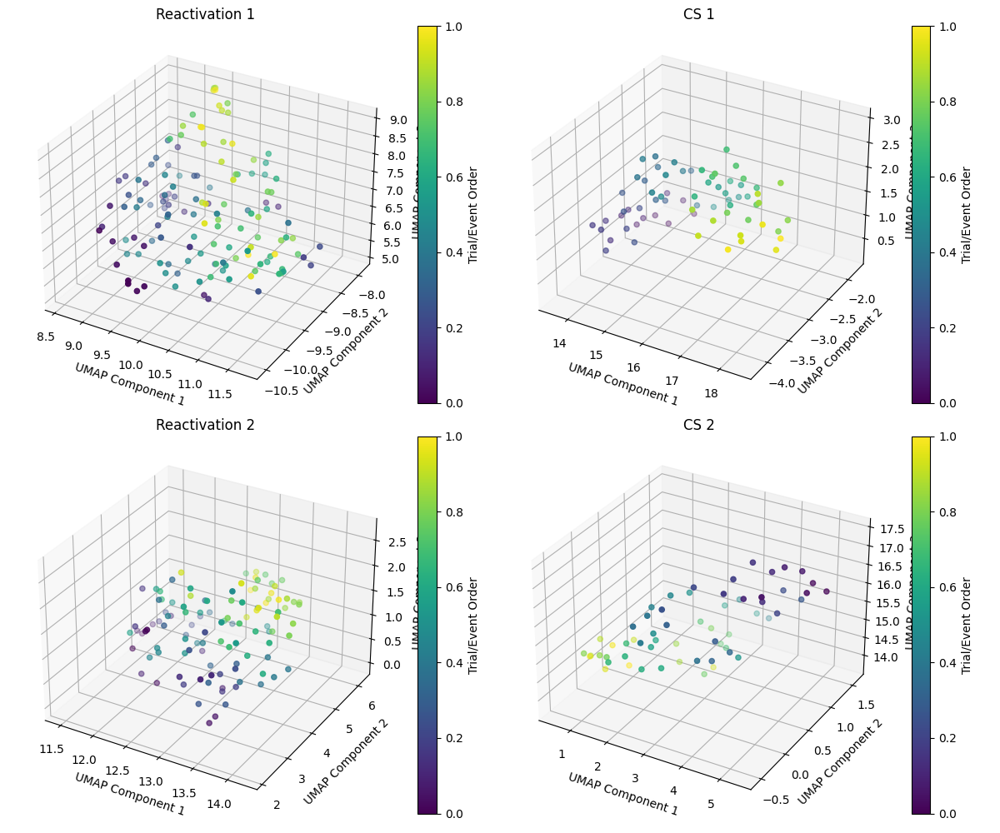

In [52]:
%matplotlib widget

reducer2= umap.UMAP(n_components=3, n_neighbors=15, min_dist=.1, random_state=42)

umap_embedding_r_1 = reducer2.fit_transform(mean_activity_r_1)
umap_embedding_cs_1 = reducer2.fit_transform(mean_activity_cs_1)
umap_embedding_r_2 = reducer2.fit_transform(mean_activity_r_2)
umap_embedding_cs_2 = reducer2.fit_transform(mean_activity_cs_2)

def scatter_with_gradient(embedding, title, ax):
    n = embedding.shape[0]
    # Create an array for the trial/event order
    trial_order = np.linspace(0, 1, n)
    # Create a scatter plot with a color gradient based on trial/event order
    sc = ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2],
                    c=trial_order, cmap='viridis', s=20)
    ax.set_title(title)
    ax.set_xlabel('UMAP Component 1')
    ax.set_ylabel('UMAP Component 2')
    ax.set_zlabel('UMAP Component 3')
    # Add a colorbar to indicate trial/event order
    plt.colorbar(sc, ax=ax, label='Trial/Event Order')

# Create a 2x2 grid with 3D subplots
fig, axes = plt.subplots(2, 2, subplot_kw={'projection': '3d'}, figsize=(12,10))

scatter_with_gradient(umap_embedding_r_1, "Reactivation 1", axes[0, 0])
scatter_with_gradient(umap_embedding_cs_1, "CS 1", axes[0, 1])
scatter_with_gradient(umap_embedding_r_2, "Reactivation 2", axes[1, 0])
scatter_with_gradient(umap_embedding_cs_2, "CS 2", axes[1, 1])

plt.tight_layout()
plt.show()


raw_activity_cs1 shape: (3124, 22, 68)
raw_activity_cs2 shape: (3124, 22, 60)


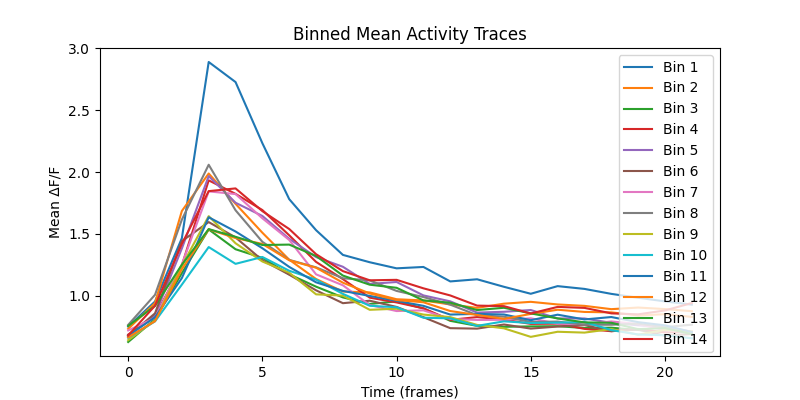

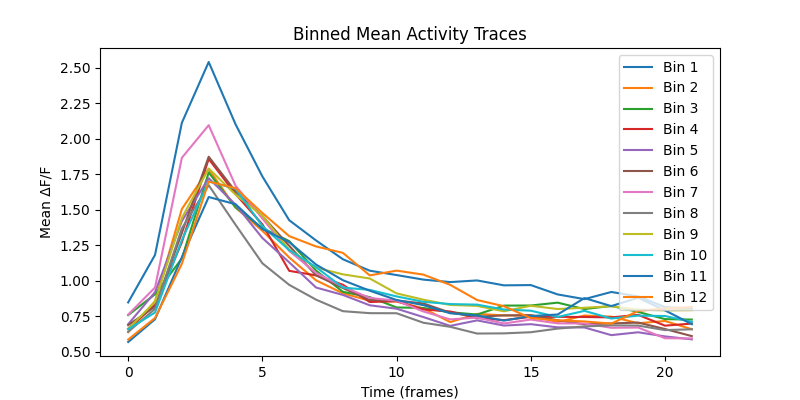

In [31]:
import numpy as np

raw_activity_cs1 = []
raw_activity_cs2 = []
raw_activity_any = []  

# Loop over each onset and offset in the behavior data
for i in range(len(behavior['onsets'])):
    start = int(behavior['onsets'][i])
    end = int(behavior['offsets'][i]) + 1
    # Extract raw activity trace for the event (shape: neurons x time)
    trial_activity = activity[:, start:end]
    # Crop each trial to 22 time points (if longer, keep the first 22)
    trial_activity = trial_activity[:, :22]
    
    # Save the trial activity in the global list for baseline computation
    raw_activity_any.append(trial_activity)
    
    # Store the trace according to the cue code
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        raw_activity_cs1.append(trial_activity)
    elif behavior['cue_codes'][i] == behavior['cs_2_code']:
        raw_activity_cs2.append(trial_activity)

# Stack the trials into 3D arrays with shape (neurons, time, trial)
raw_activity_any = np.stack(raw_activity_any, axis=2)    # Shape: (neurons, time, total_trials)
raw_activity_cs1 = np.stack(raw_activity_cs1, axis=2)      # Shape: (neurons, time, cs1_trials)
raw_activity_cs2 = np.stack(raw_activity_cs2, axis=2)      # Shape: (neurons, time, cs2_trials)

# Compute the global baseline per neuron (averaging over time and across all trials)
baseline = np.mean(raw_activity_any, axis=(1, 2))  # Shape: (neurons,)

# Compute delta F over F
raw_activity_cs1 = (raw_activity_cs1 / baseline[:, None, None])
raw_activity_cs2 = (raw_activity_cs2 / baseline[:, None, None])

print("raw_activity_cs1 shape:", raw_activity_cs1.shape)
print("raw_activity_cs2 shape:", raw_activity_cs2.shape)

def bin_trials(activity, bin_size):
    n_trials = activity.shape[2]
    binned_traces = []
    for i in range(0, n_trials, bin_size):
        # Average over each bin of trials
        binned_traces.append(np.mean(activity[:, :, i:i+bin_size], axis=2))
    return np.stack(binned_traces, axis=0)  # shape: (n_bins, neurons, time)

# Bin the data for cs1
bin_size = 5
binned_cs1 = bin_trials(raw_activity_cs1, bin_size)  # shape: (n_bins, neurons, time)
binned_cs2 = bin_trials(raw_activity_cs2, bin_size)  # shape: (n_bins, neurons, time)


# Compute the mean trace for each bin (averaging over neurons)
binned_mean_cs1 = np.mean(binned_cs1, axis=1)  # shape: (n_bins, time)
binned_mean_cs2 = np.mean(binned_cs2, axis=1)  # shape: (n_bins, time)

plt.figure(figsize=(8, 4))
for i, trace in enumerate(binned_mean_cs1):
    plt.plot(trace, label=f'Bin {i+1}')
plt.xlabel('Time (frames)')
plt.ylabel('Mean ΔF/F')
plt.title('Binned Mean Activity Traces')
plt.legend()
plt.show()


plt.figure(figsize=(8, 4))
for i, trace in enumerate(binned_mean_cs2):
    plt.plot(trace, label=f'Bin {i+1}')
plt.xlabel('Time (frames)')
plt.ylabel('Mean ΔF/F')
plt.title('Binned Mean Activity Traces')
plt.legend()
plt.show()




In [32]:
# Threshold for reactivation probability
p_threshold = 0.75

# Initialize dictionaries to store traces
r1_traces = {}  # For CS1 reactivation traces
r2_traces = {}  # For CS2 reactivation traces
trace_index_r1 = 0  # Unique key for each CS1 trace
trace_index_r2 = 0  # Unique key for each CS2 trace

# Variables for reactivation detection
cs_1_peak = 0
cs_2_peak = 0
i = 0
next_r = 0

# Loop through reactivation predictions to detect events
while i < len(reactivation_cs_1) - 1:
    if reactivation_cs_1[i] > 0 or reactivation_cs_2[i] > 0:
        if next_r == 0:
            r_start = i
            next_r = 1
        # Update peak reactivation probabilities
        if reactivation_cs_1[i] > cs_1_peak:
            cs_1_peak = reactivation_cs_1[i]
        if reactivation_cs_2[i] > cs_2_peak:
            cs_2_peak = reactivation_cs_2[i]
    
        # Check if reactivation event has ended
        if reactivation_cs_1[i + 1] <= 0.001 and reactivation_cs_2[i + 1] <= 0.001:
            r_end = i + 1
            next_r = 0

            # Compute a time vector for this event (in seconds)
            time_vector = np.arange(r_start, r_end) / behavior['framerate']

            if cs_1_peak > p_threshold:
                # Loop through onsets, starting at index 1 to allow j-1
                for j in range(1, len(onsets_cs_1)):
                    if r_start < onsets_cs_1[j] and r_start > onsets_cs_1[j-1] and \
                       r_start < onsets_cs_1[j-1] + int(behavior['framerate'] * 61):
                        # Extract raw activity trace for this reactivation event
                        r1_trace = activity[:, r_start:r_end]
                        print("CS1 trace shape:", r1_trace.shape)
                        # Store both the time vector and trace in the dictionary
                        r1_traces[trace_index_r1] = {'time': time_vector, 'trace': r1_trace}
                        trace_index_r1 += 1

            if cs_2_peak > p_threshold:
                for j in range(1, len(onsets_cs_2)):
                    if r_start < onsets_cs_2[j] and r_start > onsets_cs_2[j-1] and \
                       r_start < onsets_cs_2[j-1] + int(behavior['framerate'] * 61):
                        r2_trace = activity[:, r_start:r_end]
                        print("CS2 trace shape:", r2_trace.shape)
                        r2_traces[trace_index_r2] = {'time': time_vector, 'trace': r2_trace}
                        trace_index_r2 += 1

            # Reset for next event and jump ahead in the index
            cs_1_peak = 0
            cs_2_peak = 0
            i = r_end
            continue  # Skip incrementing i to avoid missing events
    i += 1

# --- Normalization Step ---
# Normalize each trace according to the mean activity across reactivation traces

# For CS1 traces: compute baseline for each neuron across all CS1 reactivation traces
if r1_traces:
    # Concatenate traces along the time axis (axis=1) to get a comprehensive baseline for each neuron.
    all_r1 = np.concatenate([r1_traces[key]['trace'] for key in r1_traces], axis=1)
    baseline_r1 = np.mean(all_r1, axis=1)  # shape: (neurons,)
    # Normalize each CS1 trace
    for key in r1_traces:
        r1_traces[key]['trace_normalized'] = r1_traces[key]['trace'] / baseline_r1[:, None]

# For CS2 traces: compute baseline for each neuron across all CS2 reactivation traces
if r2_traces:
    all_r2 = np.concatenate([r2_traces[key]['trace'] for key in r2_traces], axis=1)
    baseline_r2 = np.mean(all_r2, axis=1)
    # Normalize each CS2 trace
    for key in r2_traces:
        r2_traces[key]['trace_normalized'] = r2_traces[key]['trace'] / baseline_r2[:, None]

# both r1_traces and r2_traces contain:
#   - 'time': the time vector for the event,
#   - 'trace': the raw activity trace,
#   - 'trace_normalized': the activity normalized by the mean across events.


CS1 trace shape: (3124, 173)
CS1 trace shape: (3124, 148)
CS1 trace shape: (3124, 303)
CS2 trace shape: (3124, 718)
CS2 trace shape: (3124, 69)
CS2 trace shape: (3124, 206)
CS2 trace shape: (3124, 181)
CS1 trace shape: (3124, 104)
CS1 trace shape: (3124, 356)
CS1 trace shape: (3124, 137)
CS1 trace shape: (3124, 157)
CS1 trace shape: (3124, 538)
CS2 trace shape: (3124, 381)
CS2 trace shape: (3124, 49)
CS2 trace shape: (3124, 226)
CS2 trace shape: (3124, 345)
CS1 trace shape: (3124, 665)
CS2 trace shape: (3124, 300)
CS1 trace shape: (3124, 185)
CS1 trace shape: (3124, 451)
CS2 trace shape: (3124, 393)
CS2 trace shape: (3124, 164)
CS2 trace shape: (3124, 189)
CS2 trace shape: (3124, 651)
CS2 trace shape: (3124, 43)
CS2 trace shape: (3124, 531)
CS1 trace shape: (3124, 262)
CS2 trace shape: (3124, 135)
CS2 trace shape: (3124, 53)
CS2 trace shape: (3124, 427)
CS2 trace shape: (3124, 233)
CS2 trace shape: (3124, 330)
CS1 trace shape: (3124, 108)
CS1 trace shape: (3124, 140)
CS1 trace shape: (

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


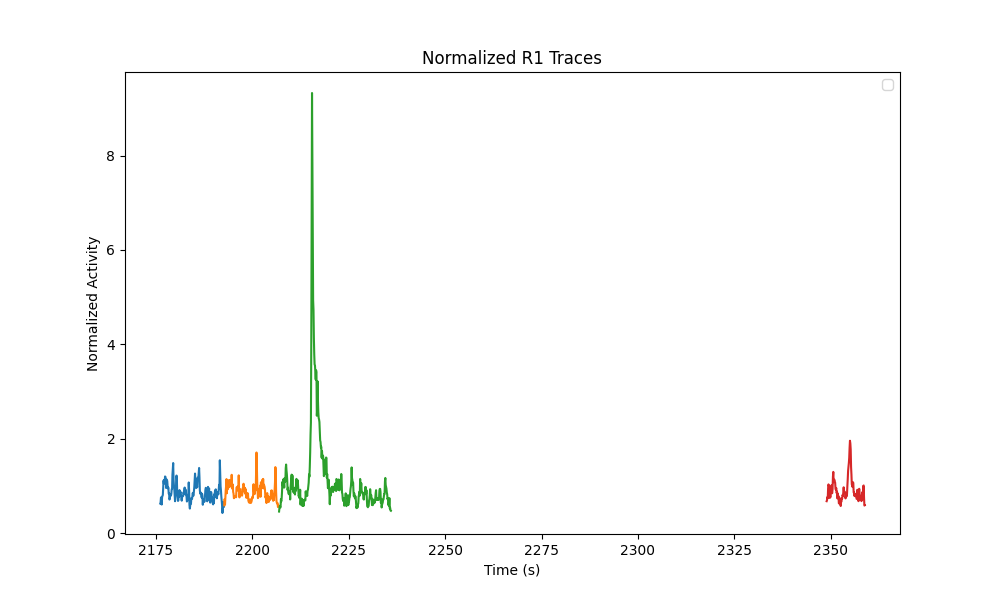

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


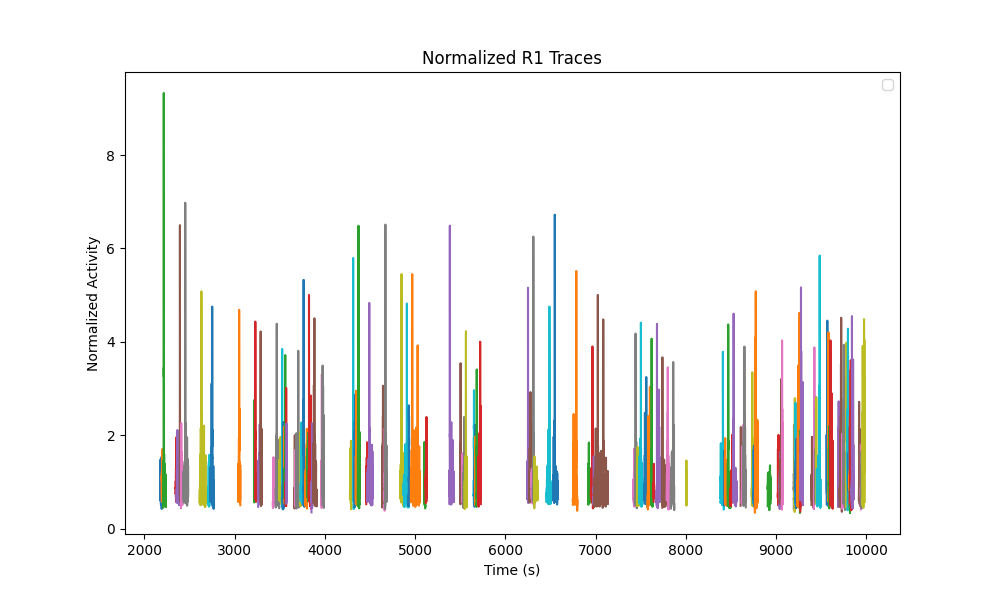

In [56]:
plt.figure(figsize=(10, 6))
for key in sorted(r1_traces.keys())[:4]:

    data = r1_traces[key]
    time_vector = np.squeeze(data['time'])
    # Average normalized activity across neurons for this event
    mean_activity = np.mean(data['trace_normalized'], axis=0)
    plt.plot(time_vector, mean_activity)

plt.xlabel("Time (s)")
plt.ylabel("Normalized Activity")
plt.title("Normalized R1 Traces")
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for key in sorted(r1_traces.keys()):

    data = r1_traces[key]
    time_vector = np.squeeze(data['time'])
    # Average normalized activity across neurons for this event
    mean_activity = np.mean(data['trace_normalized'], axis=0)
    plt.plot(time_vector, mean_activity)

plt.xlabel("Time (s)")
plt.ylabel("Normalized Activity")
plt.title("Normalized R1 Traces")
plt.legend()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


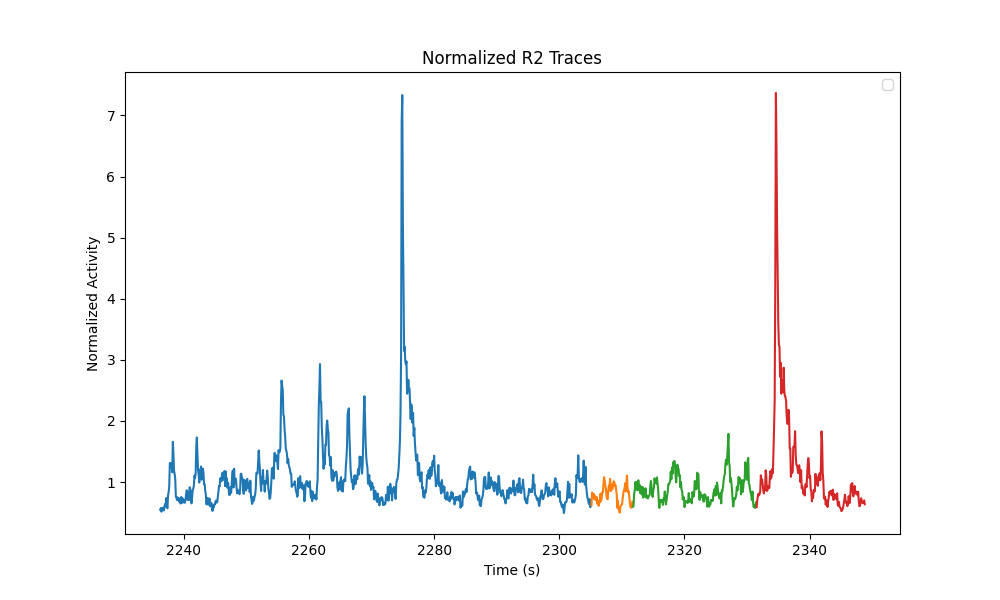

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


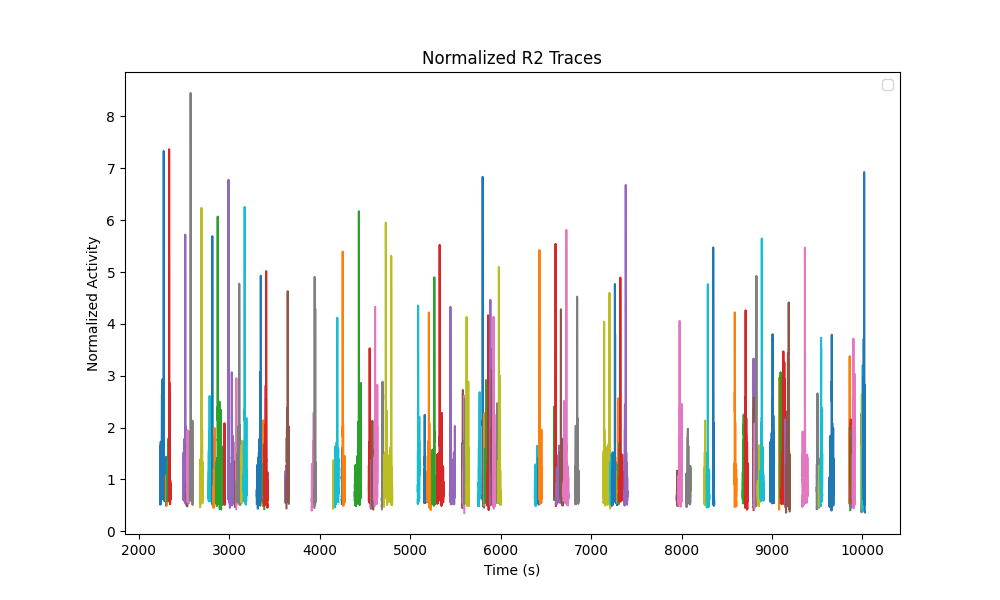

In [57]:

plt.figure(figsize=(10, 6))
for key in sorted(r2_traces.keys())[:4]:

    data = r2_traces[key]
    time_vector = np.squeeze(data['time'])
    mean_activity = np.mean(data['trace_normalized'], axis=0)
    plt.plot(time_vector, mean_activity)

plt.xlabel("Time (s)")
plt.ylabel("Normalized Activity")
plt.title("Normalized R2 Traces")
plt.legend()
plt.show()

# Plot first 10 normalized CS2 (r2) traces
plt.figure(figsize=(10, 6))
for key in sorted(r2_traces.keys()):

    data = r2_traces[key]
    time_vector = np.squeeze(data['time'])
    mean_activity = np.mean(data['trace_normalized'], axis=0)
    plt.plot(time_vector, mean_activity)

plt.xlabel("Time (s)")
plt.ylabel("Normalized Activity")
plt.title("Normalized R2 Traces")
plt.legend()
plt.show()

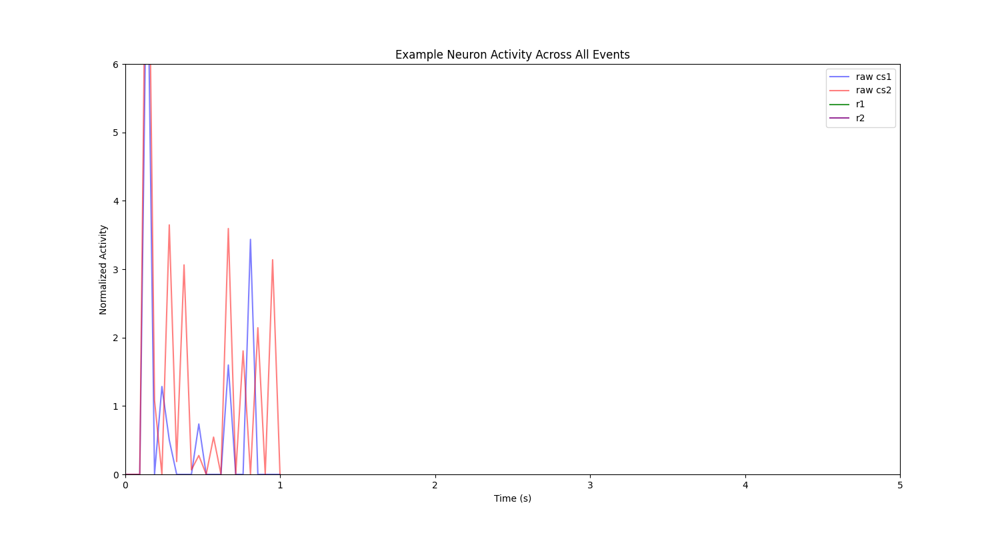

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Choose an example neuron index (e.g., 0)
neuron_idx = 10

plt.figure(figsize=(15, 8))

# --- Plot raw stimulus-evoked responses for CS1 ---
# Assume raw_activity_cs1 has shape (neurons, 22, 68)
num_events_cs1 = raw_activity_cs1.shape[2]  # 68 events
# For this example, we assume each event is 1 sec long and events are 60 sec apart.
for i in range(num_events_cs1):
    # Create a time vector for the i-th event:
    # t = event onset time + time during event.
    t_event = i * 60 + np.linspace(0, 1, raw_activity_cs1.shape[1])
    # Get the raw activity for the example neuron in this event.
    trace = raw_activity_cs1[neuron_idx, :, i]
    # Plot using blue lines; label only the first occurrence.
    plt.plot(t_event, trace, color='blue', alpha=0.5, 
             label='raw cs1' if i == 0 else "")

# --- Plot raw stimulus-evoked responses for CS2 ---
# Assume raw_activity_cs2 has shape (neurons, 22, 60)
num_events_cs2 = raw_activity_cs2.shape[2]  # 60 events
for i in range(num_events_cs2):
    t_event = i * 60 + np.linspace(0, 1, raw_activity_cs2.shape[1])
    trace = raw_activity_cs2[neuron_idx, :, i]
    plt.plot(t_event, trace, color='red', alpha=0.5, 
             label='raw cs2' if i == 0 else "")

# --- Plot normalized reactivation events for CS1 (r1_traces) ---
for idx, key in enumerate(sorted(r1_traces.keys())):
    # The stored 'time' vector is already computed for this reactivation event.
    t_event = np.squeeze(r1_traces[key]['time'])
    # Extract the normalized trace for the example neuron.
    trace = r1_traces[key]['trace_normalized'][neuron_idx, :]
    plt.plot(t_event, trace, color='green', alpha=0.8, 
             label='r1' if idx == 0 else "")

# --- Plot normalized reactivation events for CS2 (r2_traces) ---
for idx, key in enumerate(sorted(r2_traces.keys())):
    t_event = np.squeeze(r2_traces[key]['time'])
    trace = r2_traces[key]['trace_normalized'][neuron_idx, :]
    plt.plot(t_event, trace, color='purple', alpha=0.8, 
             label='r2' if idx == 0 else "")

plt.xlabel("Time (s)")
plt.xlim(0, 5)
plt.ylim(0,6)

plt.ylabel("Normalized Activity")
plt.title("Example Neuron Activity Across All Events")
plt.legend()
plt.show()


Slope: 0.00024084877467845558
P-value: 0.07754531702486087
The regression line does not significantly change over time (p >= 0.01).


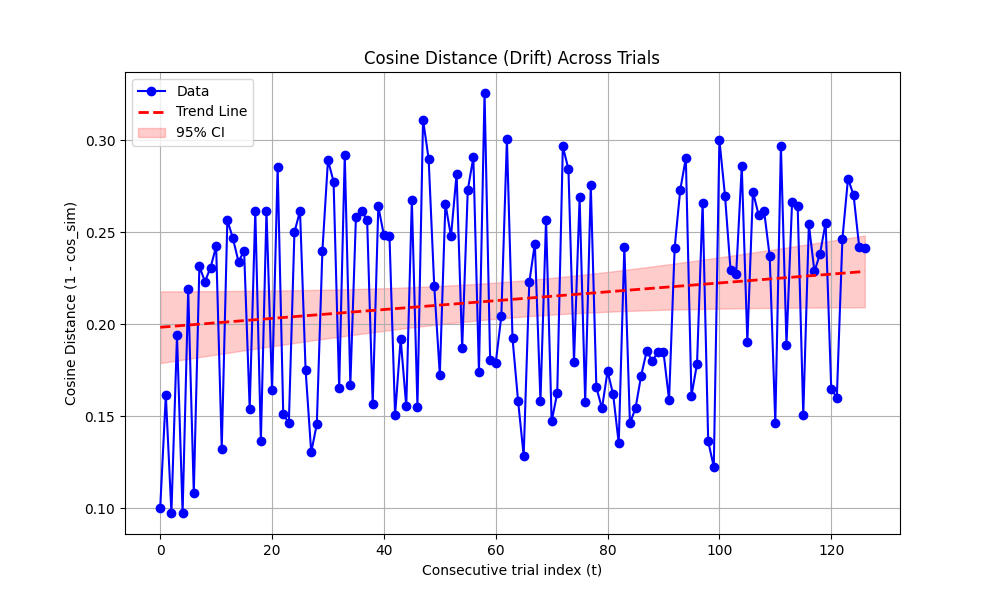

Slope: 0.0001855717096845227
P-value: 0.000511352733928677
The regression line significantly changes over time (p < 0.01).


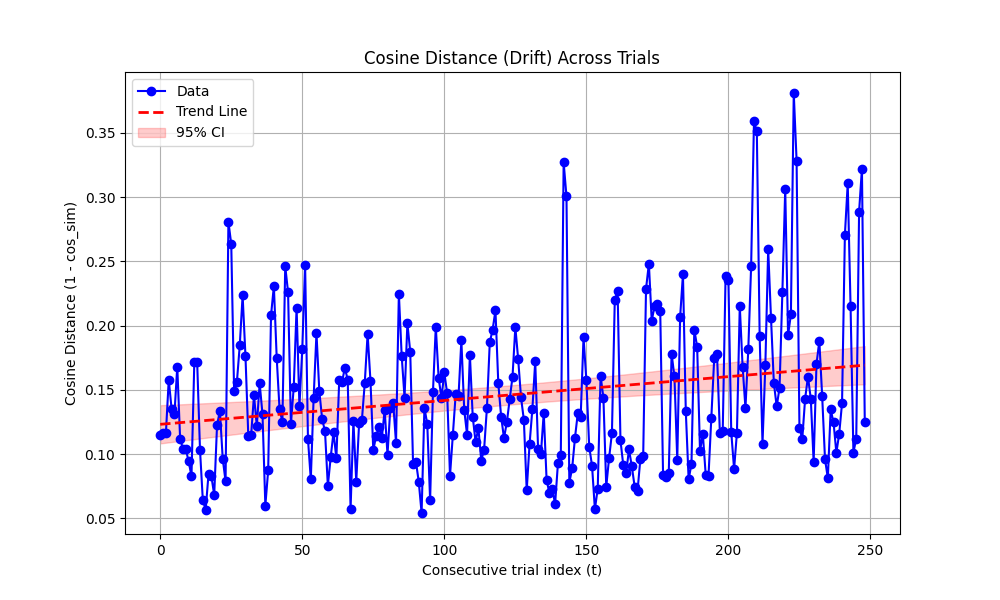

In [53]:
from numpy.linalg import norm
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress
from scipy.stats import t as t_dist


def compute_drift_cosine(mean_activity, confidence=0.95, measure="distance"):
    """
    Computes a drift metric based on consecutive-trial cosine similarity.
    
    Parameters
    ----------
    mean_activity : ndarray of shape (num_trials, num_neurons)
        mean_activity[t] is the activity vector for trial t across all neurons.
    
    confidence : float, optional
        Confidence level for confidence intervals. Default is 0.95 (95% CI).
    
    measure : {'distance', 'similarity'}, optional
        Whether to return cosine distance (drift) or cosine similarity.
        - 'distance' -> 1 - cos_sim
        - 'similarity' -> cos_sim
    
    Returns
    -------
    drift_values : ndarray
        An array of length (num_trials - 1) containing the drift or similarity
        between consecutive trials.
    """

    # Number of trials
    n_trials = mean_activity.shape[0]
    
    # Compute cosine similarity for each pair of consecutive trials
    cos_sims = []
    for t in range(n_trials - 1):
        vec_t = mean_activity[t]
        vec_tp1 = mean_activity[t+1]
        
        # Safeguard against zero-norm vectors
        denom = (norm(vec_t) * norm(vec_tp1))
        if denom == 0:
            cos_sims.append(np.nan)
        else:
            cos_sim = np.dot(vec_t, vec_tp1) / denom
            cos_sims.append(cos_sim)
    
    cos_sims = np.array(cos_sims)
    
    if measure == "distance":
        # Cosine distance = 1 - cosine similarity
        drift_values = 1 - cos_sims
        y_label = "Cosine Distance (1 - cos_sim)"
        title_str = "Cosine Distance (Drift) Across Trials"
    else:
        # Directly use cosine similarity
        drift_values = cos_sims
        y_label = "Cosine Similarity"
        title_str = "Cosine Similarity Across Trials"

    # Print the drift/similarity values
    #print(f"{measure.capitalize()} values between consecutive trials:")
    #print(drift_values)

    # Prepare data for linear regression
    x = np.arange(len(drift_values)).reshape(-1, 1)
    y = drift_values

    # Fit a linear regression model
    reg_model = LinearRegression()
    reg_model.fit(x, y)
    y_trend = reg_model.predict(x)

    # Get slope, intercept, etc. via linregress
    slope, intercept, r_value, p_value, std_err = linregress(x.flatten(), y)
    print(f"Slope: {slope}")
    print(f"P-value: {p_value}")

    if p_value < 0.01:
        print("The regression line significantly changes over time (p < 0.01).")
    else:
        print("The regression line does not significantly change over time (p >= 0.01).")

    # Calculate confidence intervals for the trend line
    n = len(y)
    dof = n - 2  # degrees of freedom
    t_crit = t_dist.ppf((1 + confidence) / 2, dof)  # critical t-value for given confidence level

    # Standard error of predicted values
    residuals = y - y_trend
    s_err = np.sqrt(np.sum(residuals**2) / dof)

    # Compute confidence interval for each predicted point
    x_mean = np.mean(x)
    x_var = np.sum((x.flatten() - x_mean)**2)
    ci = t_crit * s_err * np.sqrt(1/n + ((x.flatten() - x_mean)**2 / x_var))

    upper_bound = y_trend.flatten() + ci
    lower_bound = y_trend.flatten() - ci

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(drift_values, marker='o', linestyle='-', color='blue', label='Data')
    plt.plot(x.flatten(), y_trend, color='red', linestyle='--', linewidth=2, label='Trend Line')
    plt.fill_between(x.flatten(), lower_bound, upper_bound, color='red', alpha=0.2, 
                     label=f"{int(confidence * 100)}% CI")
    plt.xlabel('Consecutive trial index (t)')
    plt.ylabel(y_label)
    plt.title(title_str)
    plt.grid(True)
    plt.legend()
    plt.show()

    #return drift_values


compute_drift_cosine(sers_ordered)
compute_drift_cosine(reacts_ordered)
